<img src="data/Airbnb_Logo_Bélo.svg">

# Business Understanding

**Overview**

Airbnb, founded in 2008, is a internet platform for bookings and reservation of mostly private appartements and houses. It allows home-owners and renters (‘hosts’) to put their properties (‘listings’) online, so that guests can pay to stay in them. 

**How should I choose my listing's price?**

Here is the answer on Airbnb's Website in the Help Center:

*The price you charge for your listing is completely up to you. To inform your decision about what price to set, you can search for comparable listings in your city or neighborhood to get an idea of market prices.*

**Goal of this project?**

There are several motivations that drive this project. I use airbnb quite often, since I like to travel and I also wanted to apply machine learning skills to a subject that almost anyone has heard of and can relate to. 
Since it is important to work with a reasonable big dataset. I choose with Paris a City that provides 67.323 listings.
For a lot people around the world Paris represents the city of love and since I recently got married maybe it is a trip worth and we will use Airbnb. 
When it comes to the price Airbnb gives suggestions to the hosts about the base price and adjustments in certain seasons, but when talking to one of them in his experience they proved to be way lower than he could have gotten for his appartement. I want to investigate what drives the adverticed price of the other properties.

**The dataset**

I will perform an analysis of the detailed Paris listings data, sourced from the Inside Airbnb website, in order to understand the rental landscape . The dataset is named listings.csv.gz and was scraped on March 15th 2020 (week of the lockdown in Germany). It consists of 67.323 listings. A GeoJSON file of Paris borough boundaries was also downloaded from the same site.

Quite a bit of preprocessing has to be done with the dataset, since it is a bit messy. It contains as mentioned above the advertised price of the appartment and not the average amount paid per night. Therefore I will eliminate in the course of the analysis unrealistic prices to also make the model more stable. Neverless the dataset offers a lot of information that can be analysed, preprocess and used for the modelling. 


The major one is that it only includes the advertised price.  is advertised to potential guests, rather than the actual average amount paid per night by previous guests. The advertised prices can be set to any arbitrary amount by the host, and hosts that are less experienced with Airbnb will often set these to very low (e.g. £0) or very high (e.g. £10,000) amounts.

Nevertheless, this dataset can be used as a proof of concept. A more accurate version could be built using data on the actual average nightly rates paid, e.g. from sites like AirDNA that sell higher quality Airbnb data.

**Additional Information**

* Hosts are expected to set their own prices for their listings. Although Airbnb and other sites provide some general guidance, there are currently no free and accurate services which help hosts price their properties using a wide range of data points.
* You are required to put in your own expected average nightly price (‘base price’), and the algorithm will vary the daily price around that base price on each day depending on day of the week, seasonality, how far away the date is, and other factors.
* Airbnb pricing is important to get right, particularly in big cities like London where there is lots of competition and even small differences in prices can make a big difference. It is also a difficult thing to do correctly — price too high and no one will book. Price too low and you’ll be missing out on a lot of potential income.
* This project aims to solve this problem, by using machine learning and deep learning to predict the base price for properties in London. I’ve explored the preparation and cleaning of Airbnb data and conducted some exploratory data analysis in previous posts. This post is all about the creation of models to predict Airbnb prices.

One of the drawbacks of web-scrapped data is that it includes information on offers, not reservations, while some of the listings may be accidentally created or not used at all (Coles et al., 2018). To filter out inactive listings, the dataset was limited to listings which had received at least one review between the two scrappings or only appeared in the newer dataset, and had at least one review (assuming they were new listings in 2019 and had already been rented out). About 62.4% of the total listings from the 2019 dataset fulfil one of these criteria and were used in the analysis. Not all guests to Airbnb places leave their reviews, so the number of active listings may be underestimated.

# Setup

In [4]:
# Common Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import folium
import re
from collections import Counter
from datetime import datetime
from geopy.distance import great_circle

# ML Libraries
from sklearn import preprocessing
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
import xgboost as xgb
from xgboost import plot_importance
from sklearn.model_selection import GridSearchCV
import tensorflow as tf
from tensorflow import keras
from keras import models, layers, optimizers, regularizers

# Additional Libraries 
#from geopy.distance import great_circle

# Display options:
sns.set(style="white", palette="pastel",font_scale=1.5, rc={"lines.linewidth": 2.5,'figure.figsize':(11.7,8.27)})
pd.set_option('display.max_columns', None)

# Deal with warnings:
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn

Using TensorFlow backend.


# Data Mining

In [5]:
#%pwd
full_data = pd.read_csv('data/listings_paris.csv')

In [6]:
full_data.shape

(67323, 106)

In [7]:
full_data.head(1)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3109,https://www.airbnb.com/rooms/3109,20200315231126,2020-03-16,zen and calm,Appartement très calme de 50M2 Utilisation de ...,I bedroom appartment in Paris 14,I bedroom appartment in Paris 14 Good restaura...,none,Good restaurants very close the Montparnasse S...,NaN,RER B Metro Ligne 13 Pernety Metro Ligne 13 Pl...,"A la demande, vous pouvez avoir accès à la cha...",yes I can help you out,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/baeae9e2-c...,NaN,3631,https://www.airbnb.com/users/show/3631,Anne,2008-10-14,"Paris, Île-de-France, France",NaN,within a few hours,100%,40%,f,https://a0.muscache.com/im/users/3631/profile_...,https://a0.muscache.com/im/users/3631/profile_...,Alésia,1.0,1.0,"['email', 'phone', 'facebook', 'reviews']",t,f,"Paris, Île-de-France, France",XIV Arrondissement,Observatoire,NaN,Paris,Île-de-France,75014,Paris,"Paris, France",FR,France,48.83349,2.31852,f,Apartment,Entire home/apt,2,1.0,0.0,1.0,Real Bed,"{Internet,Wifi,Kitchen,""Paid parking off premi...",NaN,$60.00,$490.00,NaN,$150.00,$60.00,1,$0.00,2,30,2,2,30,30,2.0,30.0,3 weeks ago,t,16,46,76,351,2020-03-16,9,1,2016-12-27,2019-10-24,100.0,10.0,10.0,10.0,10.0,10.0,10.0,t,NaN,"{""translation missing: en.occupancy.taxes.juri...",f,f,flexible,f,f,1,1,0,0,0.23


In [6]:
# Quite a few listings do not have one review, so they went on the market quite recently or the price is set too high. 
# To overcome the problem of useless listings, we might have to drop the data, that has no review.
full_data.number_of_reviews.value_counts()

0      13923
1       5959
2       4314
3       3462
4       2815
5       2451
6       2084
7       1834
8       1636
9       1506
10      1339
11      1209
12      1159
13      1074
14      1000
16       914
15       905
17       799
18       743
19       680
20       679
21       645
22       556
23       544
24       524
25       513
26       449
27       413
29       403
28       396
       ...  
779        1
408        1
269        1
562        1
343        1
407        1
396        1
393        1
530        1
423        1
368        1
434        1
440        1
421        1
540        1
661        1
490        1
455        1
613        1
432        1
462        1
374        1
358        1
486        1
392        1
456        1
362        1
794        1
346        1
575        1
Name: number_of_reviews, Length: 437, dtype: int64

# Data Cleaning 

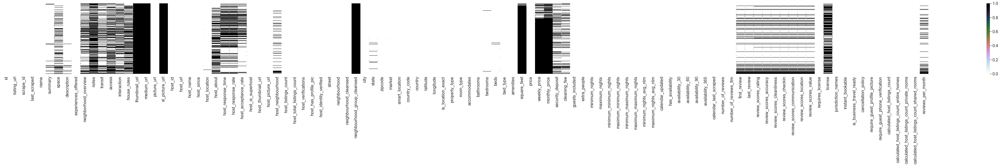

In [7]:
# There are quite a bit of missing values in the data
fig, ax = plt.subplots(figsize = (80, 5))
sns.heatmap(full_data.isna(), cmap = "cubehelix_r", yticklabels='')
plt.show()

## Dropping columns

### Columns with no entries / very few entries / no information:

In [23]:
full_data.isna().sum().sort_values(ascending=False)[0:9]
# These are the columns with almost no entries:
# thumbnail_url
# neighbourhood_group_cleansed 
# medium_url 
# xl_picture_url
# square_feet
# monthly_price
# weekly_price 
# notes
# license 

thumbnail_url                   67323
neighbourhood_group_cleansed    67323
medium_url                      67323
xl_picture_url                  67323
square_feet                     66291
monthly_price                   61479
weekly_price                    58069
notes                           47202
license                         44051
dtype: int64

In [15]:
# jurisdiction_names has no valuable information
full_data.jurisdiction_names[0:3]

0    {"translation missing: en.occupancy.taxes.juri...
1    {"translation missing: en.occupancy.taxes.juri...
2    {"translation missing: en.occupancy.taxes.juri...
Name: jurisdiction_names, dtype: object

In [14]:
full_data[['scrape_id', 'last_scraped', 'experiences_offered','bed_type' ]].head()
# scrape_id - same for all the records
# last_scraped - same for all the records
# experiences_offered - contains only none value
# bed_type - almost all have real beds

,scrape_id,last_scraped,experiences_offered,bed_type
0,20200315231126,2020-03-16,none,Real Bed
1,20200315231126,2020-03-16,none,Pull-out Sofa
2,20200315231126,2020-03-16,none,Real Bed
3,20200315231126,2020-03-16,none,Real Bed
4,20200315231126,2020-03-16,none,Real Bed


In [27]:
full_data.bed_type.value_counts()

Real Bed         64494
Pull-out Sofa     2173
Couch              431
Futon              208
Airbed              17
Name: bed_type, dtype: int64

### Text columns

In [24]:
# I will drop most Text columns, 
#since I will focus on the description column for feature extraction. 
full_data[['name','summary','space',
           'neighborhood_overview',
           'transit','access','interaction', 
           'house_rules']].head(2)
# name 
# summary
# space
# neighborhood_overview
# notes
# transit
# access
# interaction 
# house_rules

,name,summary,space,neighborhood_overview,transit,access,interaction,house_rules
0,zen and calm,Appartement très calme de 50M2 Utilisation de ...,I bedroom appartment in Paris 14,Good restaurants very close the Montparnasse S...,RER B Metro Ligne 13 Pernety Metro Ligne 13 Pl...,"A la demande, vous pouvez avoir accès à la cha...",yes I can help you out,NaN
1,Explore the heart of old Paris,"Cozy, well-appointed and graciously designed s...","Small, well appointed studio apartment at the ...","You are within walking distance to the Louvre,...",The flat is close to two or three major metro ...,"The flat includes its own modern bathroom, a w...",We expect guests to operate rather independent...,This is a small flat in a very old building th...


### Geographical Data

In [26]:
# Since we focus on Paris in this entire analysis, there are several
# columns that can be discarded. When it comes to the column 'is_location_exact',
# since it just differs 150 meters, there is no valuable information in it,
# and can also be removed. 
full_data[['country','country_code','state',
           'city','street','neighbourhood','zipcode',
           'market', 'smart_location', 'is_location_exact'
           ]].head(2)

,country,country_code,state,city,street,neighbourhood,zipcode,market,smart_location,is_location_exact
0,France,FR,Île-de-France,Paris,"Paris, Île-de-France, France",XIV Arrondissement,75014,Paris,"Paris, France",f
1,France,FR,Ile-de-France,Paris,"Paris, Ile-de-France, France",IV Arrondissement,75004,Paris,"Paris, France",t


In [8]:
# In the city column we expect just Paris, but people find quite a few ways to spell it. 
full_data.city.unique()

array(['Paris', 'Paris 11e Arrondissement', 'Paris, 4th arrondissement',
       'Paris-13E-Arrondissement', 'Levallois-Perret',
       'Paris-2E-Arrondissement', 'Paris ', 'Vincennes',
       'Boulogne-Billancourt', '10th arrondissement, Paris',
       'Paris 13e Arrondissement', nan, 'Saint-Mandé',
       'Paris-4E-Arrondissement', 'Paris 4e arrondissement',
       'Joinville-le-Pont', 'PARIS', 'Paris-19E-Arrondissement',
       'Paris 11e arrondissement', 'Le Kremlin-Bicêtre',
       'Paris 9e arrondissement', 'Paris 8è', 'NEUILLY SUR SEINE',
       'PARIS 3eme', 'Issy-les-Moulineaux', 'Paris 1er Arrondissement',
       'paris', ' Deuil-la-Barre ', 'vanves', 'Le Pré-Saint-Gervais',
       'Issy les moulineaux', 'París', 'PARIS 02', 'Parigi',
       'Paris-10E-Arrondissement', 'Paris 9e Arrondissement',
       'Paris 10e Arrondissement', 'Paris 16', 'Paris 6e arrondissement',
       'Paris 10', 'Neuilly Sur Seine ', 'Bagnolet', 'Montrouge',
       'PARIS 05', 'Paris 17', 'Neuilly-sur-

In [9]:
# There has been some cleaning already done, which we will use. There are some differences, since certain neighbourhood have been put together.
#sum((full_data.neighbourhood == full_data.neighbourhood_cleansed) == False)
#full_data.neighbourhood.unique()
full_data.neighbourhood_cleansed.unique()

array(['Observatoire', 'Hôtel-de-Ville', 'Opéra', 'Louvre', 'Popincourt',
       'Buttes-Montmartre', 'Élysée', 'Panthéon', 'Entrepôt', 'Gobelins',
       'Luxembourg', 'Buttes-Chaumont', 'Palais-Bourbon', 'Reuilly',
       'Bourse', 'Ménilmontant', 'Vaugirard', 'Batignolles-Monceau',
       'Temple', 'Passy'], dtype=object)

In [11]:
# There does not seem to be any valuable information in the Street column.
full_data.street.unique()

array(['Paris, Île-de-France, France', 'Paris, Ile-de-France, France',
       'Paris 11e Arrondissement, Île-de-France, France',
       'Paris, IDF, France', 'Paris, Paris, France', 'Paris, France',
       'Paris, Idf, France', 'Paris, IdF, France',
       'Paris, 4th arrondissement, Île-de-France, France',
       'Paris-13E-Arrondissement, Île-de-France, France',
       'Paris, FRANCE, France', 'Levallois-Perret, Île-de-France, France',
       'Paris, Ile de France, France', 'Paris, Île de France, France',
       'Paris-2E-Arrondissement, Île-de-France, France',
       'Paris, France, France', 'Paris , Ile-de-France, France',
       'Vincennes, Île-de-France, France', 'Paris, Ile de france, France',
       'Boulogne-Billancourt, Île-de-France, France',
       'Paris, france, France',
       '10th arrondissement, Paris, Île-de-France, France',
       'Paris 13e Arrondissement, Île-de-France, France', 'FR, France',
       'Saint-Mandé, Île-de-France, France',
       'Paris-4E-Arrondisse

### Picture /  Host / Calendar

In [29]:
# I will keep listing_url, so that we can look it up during the exploration,
# the other information will be dropped. 
# picture_url - interesting if we want to analyse the pictures as well but out of scope otherwise
# host_id - id that is not used anywhere else
# host_url - interesting but we can get to the host page with the listing_url
# host_name
# host_location
# host_about
# host_thumbnail_url
# host_picture_url
# host_neighbourhood
# host_verifications
# calendar_last_scraped
# calendar_updated
full_data[['picture_url','host_id','host_url','host_name',
           'host_location','host_about','host_thumbnail_url','host_picture_url',
           'host_neighbourhood', 'host_verifications', 'calendar_last_scraped', 'calendar_updated'
           ]].head(2)

,picture_url,host_id,host_url,host_name,host_location,host_about,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,calendar_last_scraped,calendar_updated
0,https://a0.muscache.com/im/pictures/baeae9e2-c...,3631,https://www.airbnb.com/users/show/3631,Anne,"Paris, Île-de-France, France",NaN,https://a0.muscache.com/im/users/3631/profile_...,https://a0.muscache.com/im/users/3631/profile_...,Alésia,"['email', 'phone', 'facebook', 'reviews']",2020-03-16,3 weeks ago
1,https://a0.muscache.com/im/pictures/52413/f9bf...,7903,https://www.airbnb.com/users/show/7903,Borzou,"Istanbul, İstanbul, Turkey",We are both journalists based in the Middle Ea...,https://a0.muscache.com/im/users/7903/profile_...,https://a0.muscache.com/im/users/7903/profile_...,Saint-Paul - Ile Saint-Louis,"['email', 'phone', 'facebook', 'google', 'revi...",2020-03-16,1 week ago


In [10]:
# The host seem to come from all over the world
full_data.host_location.nunique()

2193

### Listings count 

In [30]:
#Columns that include highly correlated data or even the same information concerning the listings_count:
#host_listings_count and host_total_listings_count do not seem 
#to display the right amount of listings,
#so they will be droped. 
#Together with the correlated calculated counts. 

# host_total_listings_count
# host_listings_count
# calculated_host_listings_count_entire_homes
# calculated_host_listings_count_private_rooms 
# calculated_host_listings_count_shared_rooms
full_data[['host_total_listings_count','host_listings_count','calculated_host_listings_count_entire_homes',
           'calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms'
           ]].head(2)

,host_total_listings_count,host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,1.0,1.0,1,0,0
1,1.0,1.0,1,0,0


In [10]:
#There are other columns that include highly correlated data or even the same information. 
#On further investigation calculated host listings counts gave more accurate information. 
#full_data.loc[((full_data.host_listings_count == full_data.calculated_host_listings_count) == False)]

In [13]:
# Some Columns to not offer any information at all
#full_data.host_has_profile_pic.value_counts()
#full_data.host_has_profile_pic.isnull().sum()
#full_data.is_business_travel_ready.value_counts()
#full_data.require_guest_phone_verification.value_counts()
#full_data.require_guest_profile_picture.value_counts()
#full_datarequires_license.value_counts()

full_data.experiences_offered.value_counts()
full_data.availability_365.value_counts()

none    67323
Name: experiences_offered, dtype: int64

### Stay Time

In [31]:
# minimum_minimum_nights
# maximum_minimum_nights
# minimum_maximum_nights
# maximum_maximum_nights
# minimum_nights_avg_ntm
# maximum_nights_avg_ntm
# availability_30
# availability_90
# availability_60

In [33]:
full_data[['minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights',
           'maximum_maximum_nights','minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
           'availability_30','availability_90','availability_60'
           ]].head(10)

,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_90,availability_60
0,2,2,30,30,2.0,30.0,16,76,46
1,1,1,1125,1125,1.0,1125.0,9,32,13
2,3,6,23,23,4.1,23.0,22,45,39
3,6,6,365,365,6.0,365.0,1,1,1
4,180,180,365,365,180.0,365.0,0,0,0
5,5,5,120,120,5.0,120.0,7,45,22
6,30,30,300,300,30.0,300.0,0,0,0
7,30,30,730,730,30.0,730.0,0,0,0
8,3,3,730,730,3.0,730.0,0,0,0
9,2,2,1125,1125,2.0,1125.0,15,26,19


### Reviews

In [34]:
# number_of_reviews_ltm
# reviews_per_month
full_data[['number_of_reviews_ltm','reviews_per_month'
           ]].head(10)

,number_of_reviews_ltm,reviews_per_month
0,1,0.23
1,48,1.65
2,29,2.46
3,0,0.05
4,0,NaN
5,8,0.29
6,4,0.37
7,0,0.15
8,0,0.33
9,24,2.79


### Columns with just one category

In [36]:
# has_availability (all)
# host_has_profile_pic 
# is_business_travel_ready (all)
# require_guest_phone_verification 
# require_guest_profile_picture 
# requires_license (all)
full_data[['has_availability','host_has_profile_pic',
           'is_business_travel_ready', 'require_guest_phone_verification',
           'require_guest_profile_picture','requires_license'
           ]].head(10)

,has_availability,host_has_profile_pic,is_business_travel_ready,require_guest_phone_verification,require_guest_profile_picture,requires_license
0,t,t,f,f,f,t
1,t,t,f,f,f,t
2,t,t,f,f,f,t
3,t,t,f,f,f,t
4,t,t,f,t,t,t
5,t,t,f,f,f,t
6,t,t,f,t,t,t
7,t,t,f,t,t,t
8,t,t,f,f,f,t
9,t,t,f,t,f,t


In [37]:
full_data.has_availability.value_counts()

t    67323
Name: has_availability, dtype: int64

In [38]:
full_data.host_has_profile_pic.value_counts()

t    67111
f      204
Name: host_has_profile_pic, dtype: int64

In [39]:
full_data.is_business_travel_ready.value_counts()

f    67323
Name: is_business_travel_ready, dtype: int64

In [40]:
full_data.requires_license.value_counts()

t    67321
f        2
Name: requires_license, dtype: int64

In [41]:
full_data.require_guest_profile_picture.value_counts()

f    66836
t      487
Name: require_guest_profile_picture, dtype: int64

### How to deal with boolean features

In [15]:
full_data.replace({'f': 0, 't': 1}, inplace=True)

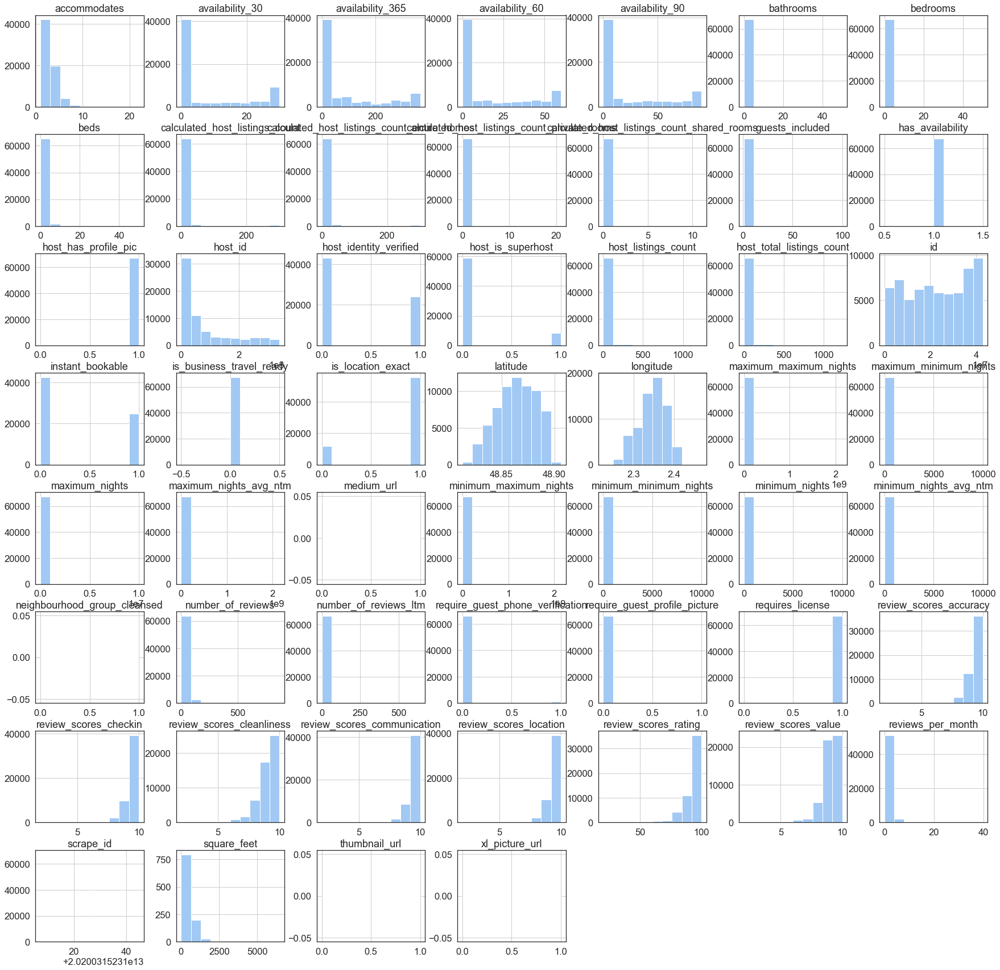

In [16]:
#fig, ax = plt.subplots(ncols=2, nrows=8,figsize=(20,60),gridspec_kw={'hspace': 0.7})
full_data.hist(figsize=(30,30));

### Summary

Columns with no entries / very few entries / no information:
(At a first glance you see that certain columns (thumbnail_url, etc.) dont have any information in them, I can therefore not use them for my EDA and model.)

* weekly_price 
* monthly_price 
* square_feet 
* license 
* jurisdiction_names 
* medium_url 
* thumbnail_url 
* notes
* neighbourhood_group_cleansed 
* xl_picture_url 
* scrape_id - same for all the records
* last_scraped - same for all the records
* experiences_offered - contains only none value
* bed_type - almost all have real beds

Text columns (The description column will be used to extract information):
* name 
* summary
* space
* neighborhood_overview
* transit
* access
* interaction 
* house_rules

Geographical data:

Since we just want to predict prices for Paris and thats what our data consists of we will drop the city column. The 'market' column as well as the 'smart location' column also do not include valuable information with only Paris in it. Also the country column is not usefull for our model, as well as the country code and the state. 
Moreover the street column does not seem to have good information.
There is also the column neighbourhood and neighbourhood_cleansed, we will keep neighbourhood cleansed, so it will match the also provided Geojson file.Since we include the neighbourhood column I will also drop the zipcodes.The column 'is_location_exact' will also not be integrated.

* country
* country_code
* state
* city
* street
* neighbourhood
* zipcode
* market
* smart_location
* is_location_exact - unimportant as it could be inacurate up to 150 meters http://insideairbnb.com/about.html#disclaimers

Further data for picture/host/calendar will be dropped, listing_url will be kept for data exploration:

* picture_url - interesting if we want to analyse the pictures as well but out of scope otherwise
* host_id - id that is not used anywhere else
* host_url - interesting but we can get to the host page with the listing_url
* host_name
* host_location
* host_about
* host_thumbnail_url
* host_picture_url
* host_neighbourhood
* host_verifications
* calendar_last_scraped
* calendar_updated

Columns that include highly correlated data or even the same information concerning the listings_count:

host_listings_count and host_total_listings_count do not seem to display the right amount of listings so they will be droped. Together with the correlated calculated counts. 

* host_total_listings_count
* host_listings_count
* calculated_host_listings_count_entire_homes
* calculated_host_listings_count_private_rooms 
* calculated_host_listings_count_shared_rooms

Columns that include highly correlated data or even the same information concering the required stay time:

Since the count of minimum and maximum stays can vary over the year, 
there are not only the minimum nights in the dataset, but also the minimum_minimum_nights, etc.
For our exploration we will only work with the minimum_nights, etc. default value
I will keep availability_365 since it is highly correlated with the others.

* minimum_minimum_nights
* maximum_minimum_nights
* minimum_maximum_nights
* maximum_maximum_nights
* minimum_nights_avg_ntm
* maximum_nights_avg_ntm
* availability_30
* availability_90
* availability_60

Columns that include highly correlated data or even the same information concering the reviews:

* number_of_reviews_ltm
* reviews_per_month


Several columns only contain one category / or very few from the other category:

* has_availability (all)
* host_has_profile_pic 
* is_business_travel_ready (all)
* require_guest_phone_verification 
* require_guest_profile_picture 
* requires_license (all)

In [273]:
raw_data = full_data.drop(['xl_picture_url','neighbourhood_group_cleansed','thumbnail_url',
                           'medium_url','jurisdiction_names','license','square_feet',
                           'monthly_price','weekly_price','country','country_code',
                           'state','city','street','neighbourhood','zipcode','market', 'availability_60',
                           'smart_location','is_location_exact','host_id','scrape_id', 'availability_90',
                           'last_scraped','name','summary','space', 'availability_30',
                           'neighborhood_overview','notes','transit','access','interaction',
                           'house_rules','experiences_offered','picture_url','host_id','bed_type',
                           'host_url','host_name','host_location','host_about','host_thumbnail_url',
                           'host_picture_url','host_neighbourhood','host_verifications','calendar_last_scraped',
                           'host_total_listings_count', 'host_listings_count','calendar_updated',
                           'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 
                           'calculated_host_listings_count_shared_rooms','minimum_minimum_nights', 'maximum_minimum_nights',
                           'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
                           'has_availability', 'host_has_profile_pic', 'is_business_travel_ready', 
                           'require_guest_phone_verification', 'require_guest_profile_picture', 'requires_license',
                           'number_of_reviews_ltm', 'reviews_per_month'], axis=1)

raw_data.set_index('id', inplace = True)

# Feature Engineering

## A closer look at the price columns

In [19]:
# All prices are euro prices and should be transformed to floats for the regression
raw_data[['price','cleaning_fee', 'extra_people', 'security_deposit']].head()

,price,cleaning_fee,extra_people,security_deposit
id,,,,
3109,$60.00,$60.00,$0.00,$150.00
5396,$115.00,$36.00,$0.00,$0.00
7397,$119.00,$50.00,$10.00,$200.00
7964,$130.00,$60.00,$20.00,$500.00
9359,$75.00,$200.00,$30.00,"$1,500.00"


In [20]:
raw_data[['price','cleaning_fee', 'extra_people', 'security_deposit']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67323 entries, 3109 to 42913034
Data columns (total 4 columns):
price               67323 non-null object
cleaning_fee        50501 non-null object
extra_people        67323 non-null object
security_deposit    47641 non-null object
dtypes: object(4)
memory usage: 2.6+ MB


In [21]:
raw_data.cleaning_fee.fillna('0', inplace=True)
raw_data.security_deposit.fillna('0', inplace=True)

In [22]:
price_list = ['price','cleaning_fee', 'extra_people', 'security_deposit']
for i in price_list:
    raw_data[i] = [float(re.sub(r'[^\d.]', '', a)) for a in raw_data[i]]

#raw_data['price_clean'] = [re.findall(r'\d+', i) for i in raw_data.price]
#set([raw_data.price_clean[i][1] for i in list(raw_data.price_clean.index.values)])
#ids = [int(re.findall(r'\d+', i)[0]) for i in X_train.creator]

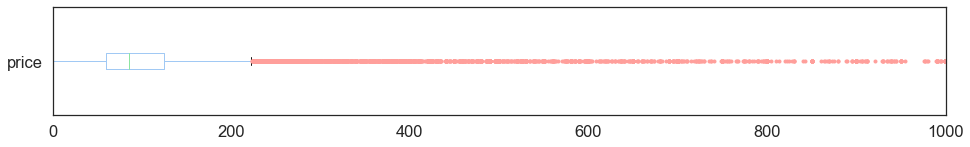

In [23]:
red_square = dict(markerfacecolor='r', markeredgecolor='r', marker='.')
raw_data['price'].plot(kind='box', xlim=(0, 1000), vert=False, flierprops=red_square, figsize=(16,2));

In [24]:
raw_data.drop(raw_data[ (raw_data.price > 600) | (raw_data.price == 0) ].index, axis=0, inplace=True)

## Bedrooms / Bathrooms / Beds 

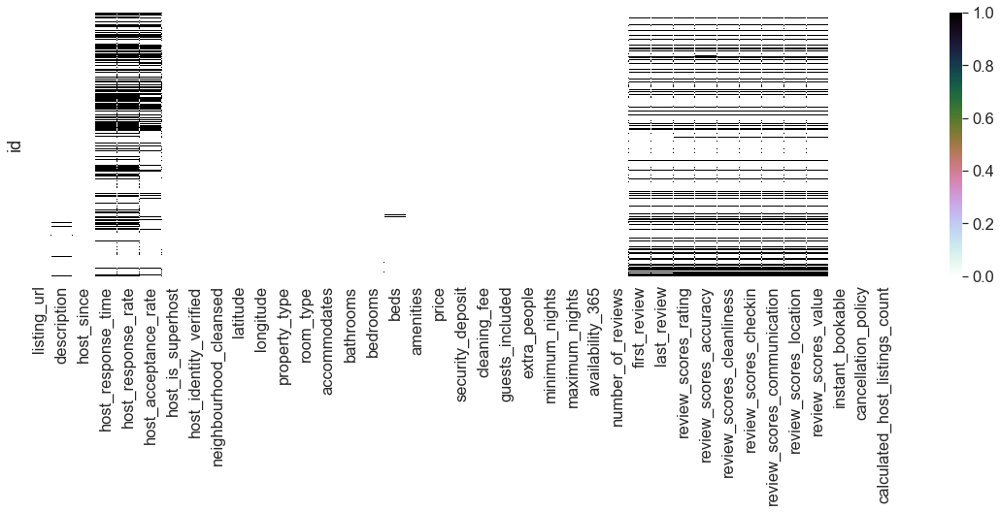

In [25]:
fig, ax = plt.subplots(figsize = (20, 5))
sns.heatmap(raw_data.isna(), cmap = "cubehelix_r", yticklabels='')
plt.show()

In [26]:
# just a few missing columns
raw_data.dropna(subset=['bathrooms', 'bedrooms', 'beds', ], inplace=True)
#for col in ['bathrooms', 'bedrooms', 'beds']:
#    df[col].fillna(df[col].median(), inplace=True)

## host 

### host_is_superhost 

In [27]:
# just a few missing columns
raw_data.dropna(subset=['host_is_superhost'], inplace=True)

In [28]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65575 entries, 3109 to 42913034
Data columns (total 39 columns):
listing_url                       65575 non-null object
description                       64559 non-null object
host_since                        65575 non-null object
host_response_time                35811 non-null object
host_response_rate                35811 non-null object
host_acceptance_rate              46031 non-null object
host_is_superhost                 65575 non-null float64
host_identity_verified            65575 non-null float64
neighbourhood_cleansed            65575 non-null object
latitude                          65575 non-null float64
longitude                         65575 non-null float64
property_type                     65575 non-null object
room_type                         65575 non-null object
accommodates                      65575 non-null int64
bathrooms                         65575 non-null float64
bedrooms                          65575 n

### host_since 

In [29]:
# Converting to datetime
raw_data.host_since = pd.to_datetime(raw_data.host_since) 

# Calculating the number of days
raw_data['host_days_active'] = (datetime(2019, 4, 9) - raw_data.host_since).astype('timedelta64[D]')

# Printing mean and median
print("Mean days as host:", round(raw_data['host_days_active'].mean(),0))
print("Median days as host:", raw_data['host_days_active'].median())

# Replacing null values with the median
raw_data.host_days_active.fillna(raw_data.host_days_active.median(), inplace=True)

Mean days as host: 1296.0
Median days as host: 1382.0


### host_acceptance_rate 

In [30]:
# Removing the % sign from the host_response_rate string and converting to an integer
raw_data['host_acceptance_rate'] = [float(re.sub(r'[^\d.]', '', a)) if type(a)!=float else float(a) for a in raw_data['host_acceptance_rate']]
# Bin into four categories
raw_data.host_acceptance_rate = pd.cut(raw_data.host_acceptance_rate, bins=[0, 60, 99, 100], labels=['0-59%', '60-99%', '100%'], include_lowest=True)
# Converting to string
raw_data.host_acceptance_rate = raw_data.host_acceptance_rate.astype('str')
# Replace nulls with 'unknown'
raw_data.host_acceptance_rate.replace('nan', 'unknown', inplace=True)
# Category counts
raw_data.host_acceptance_rate.value_counts()

60-99%     21210
unknown    19544
100%       16019
0-59%       8802
Name: host_acceptance_rate, dtype: int64

### host_response_rate 

In [31]:
# Removing the % sign from the host_response_rate string and converting to an integer
raw_data['host_response_rate'] = [float(re.sub(r'[^\d.]', '', a)) if type(a)!=float else float(a) for a in raw_data['host_response_rate']]
# Bin into four categories
raw_data.host_response_rate = pd.cut(raw_data.host_response_rate, bins=[0, 60, 99, 100], labels=['0-59%', '60-99%', '100%'], include_lowest=True)
# Converting to string
raw_data.host_response_rate = raw_data.host_response_rate.astype('str')
# Replace nulls with 'unknown'
raw_data.host_response_rate.replace('nan', 'unknown', inplace=True)
# Category counts
raw_data.host_response_rate.value_counts()

unknown    29764
100%       25675
60-99%      7791
0-59%       2345
Name: host_response_rate, dtype: int64

### host_response_time 

In [32]:
# Replace nulls with 'unknown'
raw_data.host_response_time.fillna("unknown", inplace=True)
# Category counts
raw_data.host_response_time.value_counts()

unknown               29764
within an hour        21232
within a few hours     7410
within a day           5850
a few days or more     1319
Name: host_response_time, dtype: int64

## amenities 

In [33]:
#amenities count
def amenities_counter(x):
    return len(x.split(","))

raw_data['amenities_count'] = raw_data.amenities.map(amenities_counter)
raw_data.head(3)

,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3109,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,2,1.0,0.0,1.0,"{Internet,Wifi,Kitchen,""Paid parking off premi...",60.0,150.0,60.0,1,0.0,2,30,351,9,2016-12-27,2019-10-24,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,flexible,1,3829.0,16
5396,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,2,1.0,0.0,1.0,"{Internet,Wifi,Kitchen,Heating,Washer,""Smoke d...",115.0,0.0,36.0,1,0.0,1,2,32,215,2009-06-30,2020-03-01,90.0,8.0,8.0,9.0,9.0,10.0,8.0,1,strict_14_with_grace_period,1,3706.0,17
7397,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,4,1.0,2.0,2.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",119.0,200.0,50.0,2,10.0,4,23,238,268,2011-04-08,2020-02-26,94.0,10.0,9.0,10.0,10.0,10.0,10.0,0,moderate,1,3874.0,30


In [34]:
results = Counter()
raw_data['amenities'].str.strip('{}')\
               .str.replace('"', '')\
               .str.lstrip('\"')\
               .str.rstrip('\"')\
               .str.split(',')\
               .apply(results.update)

results.most_common(100)

[('Heating', 62192),
 ('Kitchen', 61811),
 ('Wifi', 61535),
 ('Essentials', 61430),
 ('Washer', 50578),
 ('Hangers', 46886),
 ('Smoke detector', 46862),
 ('Hair dryer', 45258),
 ('Iron', 44446),
 ('TV', 42931),
 ('Shampoo', 41437),
 ('Laptop friendly workspace', 40100),
 ('Hot water', 35576),
 ('Refrigerator', 29625),
 ('Dishes and silverware', 29413),
 ('Elevator', 26231),
 ('Coffee maker', 24918),
 ('Bed linens', 24141),
 ('Cooking basics', 23839),
 ('Microwave', 22427),
 ('Oven', 20922),
 ('Internet', 19461),
 ('Stove', 19406),
 ('Family/kid friendly', 19313),
 ('Dryer', 18964),
 ('Cable TV', 15502),
 ('Carbon monoxide detector', 15142),
 ('Dishwasher', 13529),
 ('Host greets you', 12781),
 ('Paid parking off premises', 12732),
 ('Extra pillows and blankets', 10780),
 ('Buzzer/wireless intercom', 10566),
 ('Private entrance', 9496),
 ('Smoking allowed', 9150),
 ('Long term stays allowed', 8984),
 ('First aid kit', 8910),
 ('Luggage dropoff allowed', 8603),
 ('Breakfast', 8424),
 ('F

In [79]:
sub_df = pd.DataFrame(results.most_common(20), columns=['amenity', 'count'])

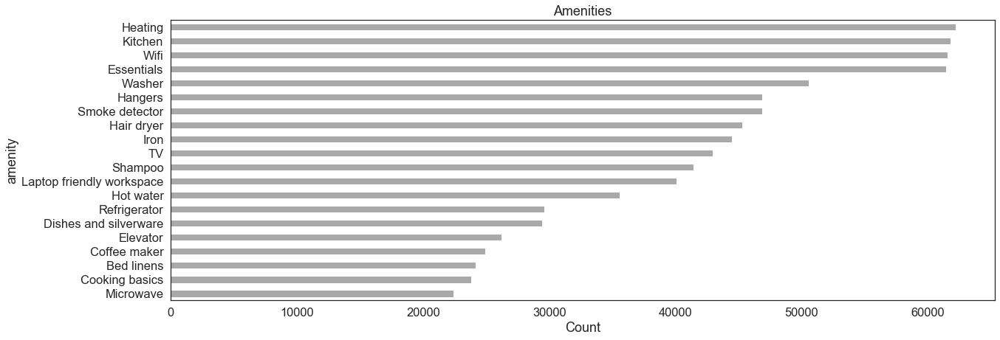

In [80]:
sub_df.sort_values(by=['count'], ascending=True).plot(kind='barh', x='amenity', y='count',  
                                                      figsize=(20,7), legend=False, color='darkgrey',
                                                      title='Amenities')
plt.xlabel('Count');

In [37]:
#raw_data['Laptop_friendly_workspace'] = raw_data['amenities'].str.contains('Laptop friendly workspace')
#raw_data['TV'] = raw_data['amenities'].str.contains('TV')
#raw_data['Family_kid_friendly'] = raw_data['amenities'].str.contains('Family/kid friendly')
#raw_data['Host_greets_you'] = raw_data['amenities'].str.contains('Host greets you')
#raw_data['Smoking_allowed'] = raw_data['amenities'].str.contains('Smoking allowed')
#raw_data.drop(['amenities'], axis=1, inplace=True)

In [280]:
list_new_features = [['check_in_24h','check_in_24h'],
                     ['Air conditioning|Central air conditioning','air_conditioning'],
                     ['Amazon Echo|Apple TV|Game console|Netflix|Projector and screen|Smart TV','high_end_electronics'],
                     ['BBQ grill|Fire pit|Propane barbeque','bbq'], 
                     ['Balcony|Patio','balcony'],
                     ['Bed linens','bed_linen'],
                     ['Breakfast','breakfast'],
                     ['TV','tv'],
                     ['Coffee maker','coffee_machine'],
                     ['Cooking basics','cooking_basics'],
                     ['Dishwasher|Dryer|Washer','household appliance'],
                     ['Elevator','elevator'],
                     ['Exercise equipment|Gym|gym','gym'],
                     ['Family/kid friendly|Children|children','child_friendly'],
                     ['parking','parking'],
                     ['Garden|Outdoor|Sun loungers|Terrace', 'outdoor_space'],
                     ['Host greets you', 'host_greeting'],
                     ['Hot tub|Jetted tub|hot tub|Sauna|Pool|pool', 'hot_tub_sauna_or_pool'],
                     ['Internet|Pocket wifi|Wifi', 'internet'],
                     ['Long term stays allowed', 'long_term_stays'],
                     ['Pets|pet|Cat(s)|Dog(s)', 'pets_allowed'],
                     ['Private entrance', 'private_entrance'],
                     ['Safe|Security system', 'secure'],
                     ['Self check-in', 'self_check_in'],
                     ['Smoking allowed', 'smoking_allowed'],
                     ['Step-free access|Wheelchair|Accessible','accessible'],
                     ['Suitable for events','event_suitable']]

for a,n in list_new_features:
    raw_data.loc[raw_data['amenities'].str.contains(a), n] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Amazon Echo|Apple TV|Game console|Netflix|Projector and screen|Smart TV'), 'high_end_electronics'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('BBQ grill|Fire pit|Propane barbeque'), 'bbq'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Balcony|Patio'), 'balcony'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Bed linens'), 'bed_linen'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Breakfast'), 'breakfast'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('TV'), 'tv'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Coffee maker'), 'coffee_machine'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Cooking basics'), 'cooking_basics'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Dishwasher|Dryer|Washer'), 'white_goods'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Elevator'), 'elevator'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Exercise equipment|Gym|gym'), 'gym'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Family/kid friendly|Children|children'), 'child_friendly'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('parking'), 'parking'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Garden|Outdoor|Sun loungers|Terrace'), 'outdoor_space'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Host greets you'), 'host_greeting'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Hot tub|Jetted tub|hot tub|Sauna|Pool|pool'), 'hot_tub_sauna_or_pool'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Internet|Pocket wifi|Wifi'), 'internet'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Long term stays allowed'), 'long_term_stays'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Pets|pet|Cat(s)|Dog(s)'), 'pets_allowed'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Private entrance'), 'private_entrance'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Safe|Security system'), 'secure'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Self check-in'), 'self_check_in'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Smoking allowed'), 'smoking_allowed'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Step-free access|Wheelchair|Accessible'), 'accessible'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Suitable for events'), 'event_suitable'] = 1

In [281]:
raw_data.head()

,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,n,check_in_24h,air_conditioning,high_end_electronics,bbq,balcony,bed_linen,breakfast,tv,coffee_machine,cooking_basics,household appliance,elevator,gym,child_friendly,parking,outdoor_space,host_greeting,hot_tub_sauna_or_pool,internet,long_term_stays,pets_allowed,private_entrance,secure,self_check_in,smoking_allowed,accessible,event_suitable
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3109,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,40%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,2,1.0,0.0,1.0,"{Internet,Wifi,Kitchen,""Paid parking off premi...",$60.00,$150.00,$60.00,1,$0.00,2,30,351,9,2016-12-27,2019-10-24,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,flexible,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
5396,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,2,1.0,0.0,1.0,"{Internet,Wifi,Kitchen,Heating,Washer,""Smoke d...",$115.00,$0.00,$36.00,1,$0.00,1,2,32,215,2009-06-30,2020-03-01,90.0,8.0,8.0,9.0,9.0,10.0,8.0,1,strict_14_with_grace_period,1,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7397,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,86%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,4,1.0,2.0,2.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",$119.00,$200.00,$50.00,2,$10.00,4,23,238,268,2011-04-08,2020-02-26,94.0,10.0,9.0,10.0,10.0,10.0,10.0,0,moderate,1,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7964,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,2,1.0,1.0,1.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Buzzer/w...",$130.00,$500.00,$60.00,2,$20.00,6,365,274,6,2010-05-10,2015-09-14,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict_14_with_grace_period,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9359,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,NaN,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,2,1.0,1.0,1.0,"{Internet,Wifi,Kitchen,Elevator,Heating,Essent...",$75.00,"$1,500.00",$200.00,1,$30.00,180,365,15,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,strict_14_with_grace_period,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# Replacing nulls with zeros for new columns
cols_to_replace_nulls = raw_data.iloc[:,40:].columns
raw_data[cols_to_replace_nulls] = raw_data[cols_to_replace_nulls].fillna(0)

# Produces a list of amenity features where one category (true or false) contains fewer than 10% of listings
infrequent_amenities = []
for col in raw_data.iloc[:,40:].columns:
    if raw_data[col].sum() < len(raw_data)/10:
        infrequent_amenities.append(col)
print(infrequent_amenities)

# Dropping infrequent amenity features
raw_data.drop(infrequent_amenities, axis=1, inplace=True)

# Dropping the original amenity feature
raw_data.drop('amenities', axis=1, inplace=True)

['air_conditioning', 'high_end_electronics', 'bbq', 'balcony', 'nature_and_views', 'gym', 'outdoor_space', 'hot_tub_sauna_or_pool', 'pets_allowed', 'secure', 'self_check_in', 'accessible', 'event_suitable']


In [41]:
raw_data.head()

,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3109,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,2,1.0,0.0,1.0,60.0,150.0,60.0,1,0.0,2,30,351,9,2016-12-27,2019-10-24,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
5396,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,2,1.0,0.0,1.0,115.0,0.0,36.0,1,0.0,1,2,32,215,2009-06-30,2020-03-01,90.0,8.0,8.0,9.0,9.0,10.0,8.0,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
7397,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,4,1.0,2.0,2.0,119.0,200.0,50.0,2,10.0,4,23,238,268,2011-04-08,2020-02-26,94.0,10.0,9.0,10.0,10.0,10.0,10.0,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
7964,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0-59%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,2,1.0,1.0,1.0,130.0,500.0,60.0,2,20.0,6,365,274,6,2010-05-10,2015-09-14,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9359,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,unknown,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,2,1.0,1.0,1.0,75.0,1500.0,200.0,1,30.0,180,365,15,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [42]:
#for col in ['bathrooms', 'bedrooms', 'beds']:
#    df[col].fillna(df[col].median(), inplace=True)

## review

### first_review and last_review

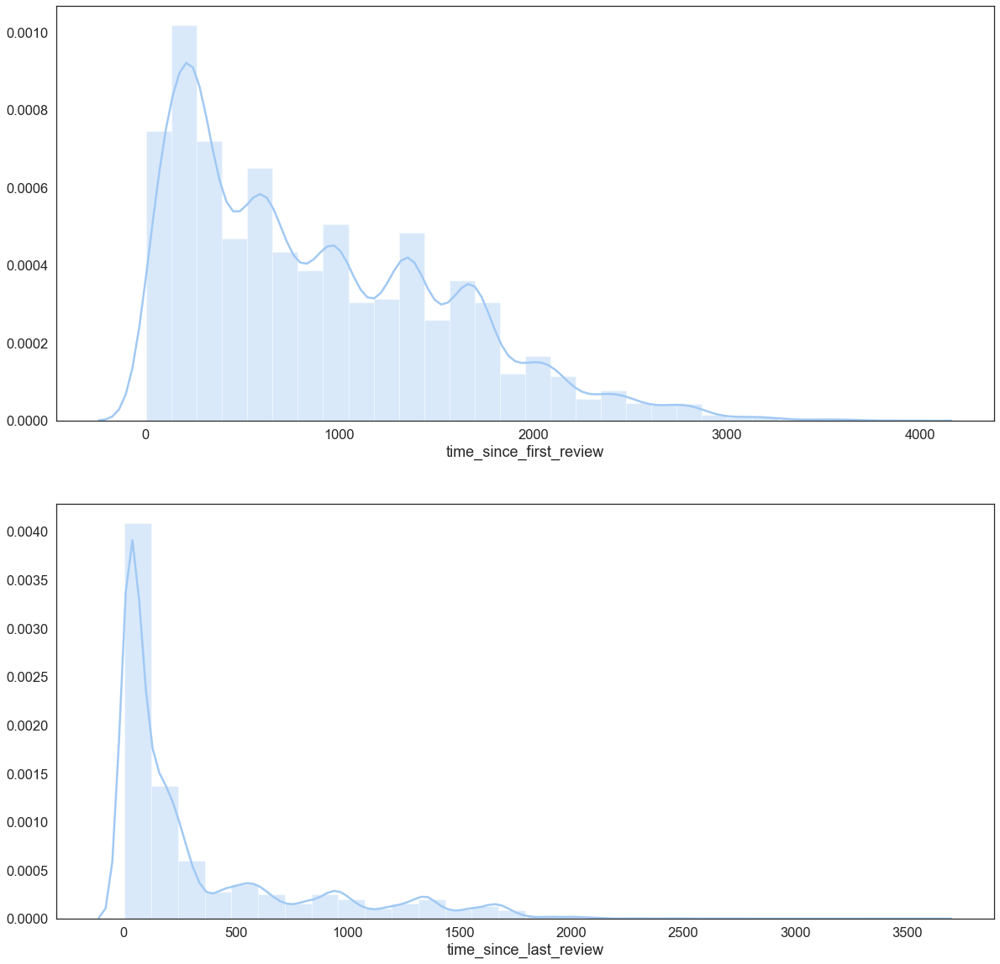

In [43]:
fig, ax = plt.subplots(nrows=2,figsize=(20,20),gridspec_kw={'wspace': 0.5})
review_list = ['first_review', 'last_review']
for idx, i in enumerate(review_list):
    raw_data[i] = pd.to_datetime(raw_data[i])
    raw_data['time_since_' + str(i)] = (datetime(2020, 3, 19) - raw_data[i]).astype('timedelta64[D]')
    sns.distplot(raw_data['time_since_' + str(i)],ax=ax[idx], bins=30)
    # ,edgecolor="grey" ,linewidth=2.5
    #raw_data['time_since_' + str(i)].hist(figsize=(15,5), bins=30);

In [44]:
review_list_time = ['time_since_first_review', 'time_since_last_review']
bins = [[0, 182, 365, 730, 1460, max(raw_data.time_since_first_review)],
        [0, 14, 60, 182, 365, max(raw_data.time_since_last_review)]]
labels = [['0-6 months','6-12 months', '1-2 years','2-3 years','4+ years'],
          ['0-2 weeks', '2-8 weeks', '2-6 months','6-12 months', '1+ year']]
                   
for idx, i in enumerate(review_list_time):
    raw_data[i] = pd.cut(raw_data[i], bins=bins[idx], labels=labels[idx], include_lowest=True)
    raw_data[i] = raw_data[i].astype('str')
    raw_data[i].fillna('no reviews', inplace=True)

In [45]:
raw_data.head()

,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3109,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,2,1.0,0.0,1.0,60.0,150.0,60.0,1,0.0,2,30,351,9,2016-12-27,2019-10-24,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2-3 years,2-6 months
5396,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,2,1.0,0.0,1.0,115.0,0.0,36.0,1,0.0,1,2,32,215,2009-06-30,2020-03-01,90.0,8.0,8.0,9.0,9.0,10.0,8.0,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,4+ years,2-8 weeks
7397,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,4,1.0,2.0,2.0,119.0,200.0,50.0,2,10.0,4,23,238,268,2011-04-08,2020-02-26,94.0,10.0,9.0,10.0,10.0,10.0,10.0,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks
7964,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0-59%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,2,1.0,1.0,1.0,130.0,500.0,60.0,2,20.0,6,365,274,6,2010-05-10,2015-09-14,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4+ years,1+ year
9359,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,unknown,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,2,1.0,1.0,1.0,75.0,1500.0,200.0,1,30.0,180,365,15,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,nan,nan


### review_scores

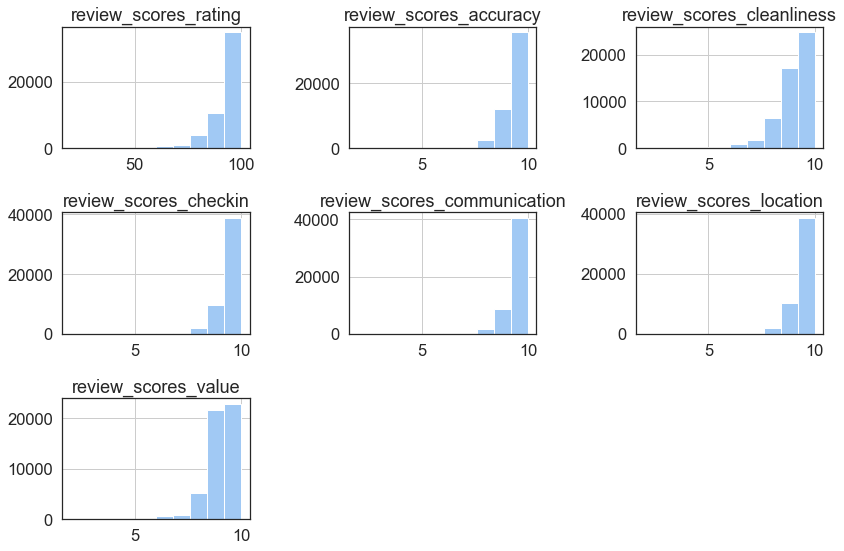

In [46]:
variables_to_plot = list(raw_data.columns[raw_data.columns.str.startswith("review_scores") == True])
fig = plt.figure(figsize=(12,8))
for i, var_name in enumerate(variables_to_plot):
    ax = fig.add_subplot(3,3,i+1)
    raw_data[var_name].hist(bins=10,ax=ax)
    ax.set_title(var_name)
fig.tight_layout()
plt.show()

In [47]:
review_scores_list = list(raw_data.columns[raw_data.columns.str.startswith("review_scores") == True])
bins = [0, 8, 9, 10]
labels = ['0-8/10', '9/10', '10/10']
                   
for i in review_scores_list[1:]:
    raw_data[i] = pd.cut(raw_data[i], bins=bins, labels=labels, include_lowest=True)
    raw_data[i] = raw_data[i].astype('str')
    raw_data[i].fillna('no reviews', inplace=True)

In [48]:
bins = [0, 80, 95, 100]
labels = ['0-79/100', '80-94/100', '95-100/100']
raw_data[review_scores_list[0]] = pd.cut(raw_data[review_scores_list[0]], bins=bins, labels=labels, include_lowest=True)
raw_data[review_scores_list[0]] = raw_data[review_scores_list[0]].astype('str')
raw_data[review_scores_list[0]].fillna('no reviews', inplace=True)

In [49]:
raw_data.first_review.unique()

array(['2016-12-27T00:00:00.000000000', '2009-06-30T00:00:00.000000000',
       '2011-04-08T00:00:00.000000000', ...,
       '2020-01-29T00:00:00.000000000', '2020-01-30T00:00:00.000000000',
       '2020-03-16T00:00:00.000000000'], dtype='datetime64[ns]')

## Distance to Centroid of Paris

In [50]:
def distance_to_mid(lat, lon):
    paris_centre = (48.864716, 2.349014)
    accommodation = (lat, lon)
    return great_circle(paris_centre, accommodation).km

In [51]:
raw_data['distance'] = raw_data.apply(lambda x: distance_to_mid(x.latitude, x.longitude), axis=1)

## Size

In [255]:
# Test for possible ways to extract size
s = full_data.description[0]

re_list = [r'\b([0-9]+) ?m2 ?', r'\b([0-9]+) ?qm ?',
           r'\b([0-9]+) ?sqm ?', r'\b([0-9]+) ?m² ?',
           r'\b([0-9]+) ?square ?', r'\b([0-9]+) ?Square ?']
matches = []
for r in re_list:
    result = re.search(r, s)
    if result:
        matches.append(result.group(0)) 
print(matches) 
s

[]


'I bedroom appartment in Paris 14 Good restaurants very close the Montparnasse Station 15 m from the center of Paris RER B Metro Ligne 13 Pernety Metro Ligne 13 Plaisance Metro Ligne 4 Mouton-Duvernet'

In [53]:
# extract numbers 

re_list = [r'\b([0-9]+) ?m2 ?', 
           r'\b([0-9]+) ?qm ?', 
           r'\b([0-9]+) ?sqm ?', 
           r'\b([0-9]+) ?m² ?',  
           r'\b([0-9]+) ?square ?',
           r'\b([0-9]+) ?Square ?']

for idx, s in enumerate(re_list):
    raw_data['size'+ str(idx)] = raw_data['description'].str.extract(s, expand=True)
    
raw_data['size'] = raw_data[raw_data.columns[58:]].apply(lambda x: ','.join(x.dropna().astype(str)), axis=1)
raw_data['size'] = raw_data['size'].apply(lambda x: min(x.split(',')))
raw_data['size'] = raw_data['size'].str.replace("\D", "")
raw_data['size'] = raw_data['size'].replace(r'^\s*$', np.nan, regex=True)

for idx, s in enumerate(re_list):
    raw_data.drop('size'+ str(idx), axis=1, inplace=True)


#def high_and_low(numbers: str):
#    """
#    Given a string of characters, ignore and split on
#    the space ' ' character and return the min(), max()
#
#    :param numbers: input str of characters
#    :return: the minimum and maximum *character* values as a tuple
#    """
#    return max(numbers.split(' ')), min(numbers.split(' '))    
    

#count = 0
#while count <= (len(re_list)-1):
#    raw_data['size_combined'+str(count)] = raw_data['size'+str(count)].combine(raw_data.['size'+str(count+1)], (lambda x, y: x if type(x) != float else y))
#    raw_data['size_combined'] = raw_data.size0.combine(raw_data.size1, (lambda x, y: x if type(x) != float else y))
#    count += 1
    

#    for 
#raw_data['size_combined'] = raw_data.size0.combine(raw_data.size1, (lambda x, y: x if type(x) != float else y))
#raw_data['size_combined1'] = raw_data.size2.combine(raw_data.size3, (lambda x, y: x if type(x) != float else y))
#raw_data['size_ready'] = raw_data.size_combined1.combine(raw_data.size_combined, (lambda x, y: x if type(x) != float else y))
#raw_data['size_ready'] = raw_data['size_ready'].str.replace("\D", "")

#r'(?P<letter>[ab])(?P<digit>\d)'
#r'(\b([0-9]+) ? m2 ?)(\b([0-9]+) ?qm ?)(\b([0-9]+) ?sqm ?)(\b([0-9]+) ? m² ?)' 
#[a-zA-Z]{3}|^[^\\d].*|([\\w&&[^b]])*
#[a-zA-Z]{3}

#^[^\\d].*

#([\\w&&[^b]])*
# change datatype of size into float
#full_data['size'] = full_data['size'].astype(float)

print('NaNs in size_column absolute:     ', raw_data['size'].isna().sum())
print('NaNs in size_column in percentage:', round(raw_data['size'].isna().sum()/len(raw_data)*100,3), '%')

NaNs in size_column absolute:      39935
NaNs in size_column in percentage: 60.9 %


In [54]:
raw_data[['size']]

,size
id,
3109,NaN
5396,30
7397,40
7964,75
9359,NaN
9952,30
10710,NaN
11170,NaN
11213,21


In [55]:
raw_data[['description', 'size']].head(100)

,description,size
id,,
3109,I bedroom appartment in Paris 14 Good restaura...,NaN
5396,"Cozy, well-appointed and graciously designed s...",30
7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",40
7964,Very large & nice apartment all for you! - Su...,75
9359,Location! Location! Location! Just bring your ...,NaN
9952,"Je suis une dame retraitée, qui propose un agr...",30
10710,Very close to Place de la Concorde and Madelei...,NaN
11170,The apartment is located in the well known Qua...,NaN
11213,Numéro d'enregistrement Ville de Paris (Phone ...,21


In [56]:
sub_df = raw_data[['accommodates', 'bathrooms', 'bedrooms', 'cleaning_fee', 
                   'security_deposit', 'extra_people', 'guests_included', 'distance', 'size']]

In [57]:
# split datasets
train_data = sub_df[sub_df['size'].notnull()]
test_data  = sub_df[sub_df['size'].isnull()]

# define X
X_train = train_data.drop('size', axis=1)
X_test  = test_data.drop('size', axis=1)

# define y
y_train = train_data['size']

In [58]:
print("Shape of Training Data:", train_data.shape)
print("Shape of Test Data:    ",test_data.shape)
print("\nShape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("\nShape of y_train:", y_train.shape)

Shape of Training Data: (25640, 9)
Shape of Test Data:     (39935, 9)

Shape of X_train: (25640, 8)
Shape of X_test: (39935, 8)

Shape of y_train: (25640,)


In [59]:
# import Linear Regression
from sklearn.linear_model import LinearRegression

# instantiate
linreg = LinearRegression()

# fit model to training data
linreg.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [60]:
# making predictions
y_test = linreg.predict(X_test)

In [61]:
y_test = pd.DataFrame(y_test)
y_test.columns = ['size']
print(y_test.shape)
y_test.head()

(39935, 1)


,size
0,35.978620
1,63.643509
2,51.374765
3,21.857724
4,53.049762


In [62]:
# make the index of X_test to an own dataframe
prelim_index = pd.DataFrame(X_test.index)
prelim_index.columns = ['prelim']

# ... and concat this dataframe with y_test
y_test = pd.concat([y_test, prelim_index], axis=1)
y_test.set_index(['prelim'], inplace=True)
y_test.head()

,size
prelim,
3109,35.978620
9359,63.643509
10710,51.374765
11170,21.857724
11798,53.049762


In [63]:
new_test_data = pd.concat([X_test, y_test], axis=1)

In [64]:
print(new_test_data.shape)
new_test_data.head()

(39935, 9)


,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,35.978620
9359,2,1.0,1.0,200.0,1500.0,30.0,1,0.648235,63.643509
10710,4,1.0,1.0,60.0,600.0,10.0,3,2.885256,51.374765
11170,2,1.0,0.0,0.0,0.0,0.0,2,2.008292,21.857724
11798,3,1.0,1.0,40.0,600.0,10.0,2,4.736548,53.049762


In [65]:
new_test_data['size'].isna().sum()

0

In [66]:
sub_df_new = pd.concat([new_test_data, train_data], axis=0)

print(sub_df_new.shape)
sub_df_new.head()

(65575, 9)


,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,35.9786
9359,2,1.0,1.0,200.0,1500.0,30.0,1,0.648235,63.6435
10710,4,1.0,1.0,60.0,600.0,10.0,3,2.885256,51.3748
11170,2,1.0,0.0,0.0,0.0,0.0,2,2.008292,21.8577
11798,3,1.0,1.0,40.0,600.0,10.0,2,4.736548,53.0498


In [67]:
sub_df_new['size'].isna().sum()

0

In [68]:
# prepare the multiple columns before concatening
raw_data.drop(['accommodates', 'bathrooms', 'bedrooms', 'cleaning_fee', 
              'security_deposit', 'extra_people', 'guests_included', 'distance', 'size'], 
               axis=1, inplace=True)

In [69]:
raw_data

,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3109,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,1.0,60.0,2,30,351,9,2016-12-27,2019-10-24,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2-3 years,2-6 months
5396,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,1.0,115.0,1,2,32,215,2009-06-30,2020-03-01,80-94/100,0-8/10,0-8/10,9/10,9/10,10/10,0-8/10,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,4+ years,2-8 weeks
7397,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,2.0,119.0,4,23,238,268,2011-04-08,2020-02-26,80-94/100,10/10,9/10,10/10,10/10,10/10,10/10,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks
7964,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0-59%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,1.0,130.0,6,365,274,6,2010-05-10,2015-09-14,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4+ years,1+ year
9359,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,unknown,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,1.0,75.0,180,365,15,0,NaT,NaT,nan,nan,nan,nan,nan,nan,nan,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,nan,nan
9952,https://www.airbnb.com/rooms/9952,"Je suis une dame retraitée, qui propose un agr...",2009-08-24,within an hour,100%,100%,0.0,0.0,Popincourt,48.86227,2.37134,Apartment,Entire home/apt,1.0,75.0,5,120,305,25,2013-03-19,2020-01-21,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,1,moderate,1,3515.0,26,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks
10710,https://www.airbnb.com/rooms/10710,Very close to Place de la Concorde and Madelei...,2009-09-13,unknown,unknown,unknown,0.0,1.0,Élysée,48.87900,2.31608,Apartment,Entire home/apt,2.0,90.0,3,730,0,40,2010-04-07,2019-01-25,80-94/100,9/10,9/10,10/10,10/10,10/10,9/10,1,strict_14_with_grace_period,1,3495.0,23,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,4+ years,1+ year
11170,https://www.airbnb.com/rooms/11170,The apartment is located in the well known Qua...,2009-09-24,within a day,100%,60-99%,0.0,1.0,Panthéon,48.84670,2.35095,Apartment,Entire home/apt,1.0,75.0,2,1125,199,355,2009-09-28,2020-03-08,80-94/100,10/10,9/10,10/10,10/10,10/10,9/10,0,moderate,1,3484.0,19,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,0-2 weeks
11213,https://www.airbnb.com/rooms/11213,Numéro d'enregistrement Ville de Par

In [70]:
raw_data = pd.concat([sub_df_new, raw_data], axis=1)

In [71]:
raw_data.describe()

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,host_is_superhost,host_identity_verified,latitude,longitude,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,instant_bookable,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed
count,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,6.557500e+04,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000,65575.000000
mean,3.042791,1.114868,1.074907,30.938681,285.712482,5.647274,1.488494,2.871435,0.124849,0.363477,48.864121,2.345580,1.652810,107.535067,5.279665,8.573175e+02,84.531376,20.712070,0.360488,7.965124,1295.893923,18.505909,0.100419,0.368143,0.129043,0.663896,0.379992,0.363538,0.789035,0.400015,0.311384,0.247030,0.194907,0.945513,0.137003,0.144811,0.139535
std,1.519517,0.629130,0.971488,34.386889,493.088177,13.721923,1.093747,1.418917,0.330551,0.481004,0.018451,0.033434,1.091482,80.789892,43.982086,3.905551e+04,121.877648,42.301794,0.480146,33.423409,819.676831,8.306706,0.300561,0.482304,0.335250,0.472378,0.485388,0.481021,0.407996,0.489905,0.463063,0.431288,0.396132,0.226978,0.343854,0.351913,0.346506
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.011736,0.000000,0.000000,48.813400,2.225070,0.000000,8.000000,1.000000,1.000000e+00,0.000000,0.000000,0.000000,1.000000,-341.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.813001,0.000000,0.000000,48.850715,2.324430,1.000000,60.000000,1.000000,3.000000e+01,0.000000,1.000000,0.000000,1.000000,729.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,2.000000,1.000000,1.000000,25.000000,150.000000,0.000000,1.000000,2.848247,0.000000,0.000000,48.865240,2.348530,1.000000,85.000000,2.000000,1.125000e+03,5.000000,6.000000,0.000000,1.000000,1382.000000,17.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,4.000000,1.000000,1.000000,50.000000,400.000000,5.000000,2.000000,3.857170,0.000000,1.000000,48.879205,2.370860,2.000000,120.000000,4.000000,1.125000e+03,147.000000,21.000000,1.000000,1.000000,1875.000000,24.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,22.000000,50.000000,50.000000,600.000000,4740.000000,270.000000,100.000000,9.907948,1.000000,1.000000,48.906060,2.467050,50.000000,600.000000,9999.000000,1.000000e+07,365.000000,867.000000,1.000000,301.000000,3874.000000,91.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [72]:
raw_data['size'].isna().sum()

0

In [73]:
raw_data['size'].head()

3109    35.9786
5396         30
7397         40
7964         75
9359    63.6435
Name: size, dtype: object

In [74]:
raw_data['size'] = raw_data['size'].astype(float)

In [75]:
raw_data['size'].describe()

count    65575.000000
mean        52.593818
std        262.219360
min        -58.378364
25%         32.000000
50%         45.539253
75%         57.460527
max      47100.000000
Name: size, dtype: float64

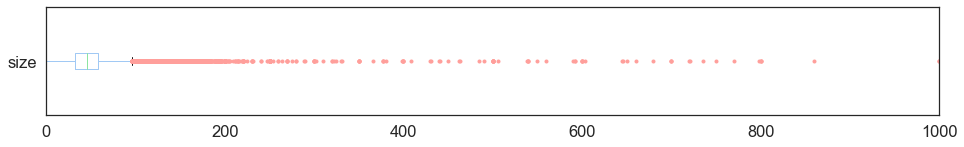

In [76]:
red_square = dict(markerfacecolor='r', markeredgecolor='r', marker='.')
raw_data['size'].plot(kind='box', xlim=(0, 1000), vert=False, flierprops=red_square, figsize=(16,2));

In [77]:
raw_data.drop(raw_data[ (raw_data['size'] <= 0.) | (raw_data['size'] > 300.) ].index, axis=0, inplace=True)

In [78]:
print("The dataset has {} rows and {} columns - after being engineered.".format(*raw_data.shape))

The dataset has 65442 rows and 59 columns - after being engineered.


In [80]:
#s = 30
#print(raw_data['description'][s])
#raw_data['size_ready'][s]

## Subway

In [269]:
#raw_data.loc[raw_data['description'].str.contains('subway|Metro|metro'), 'subway'] = 1
#full_data.description[6]
raw_data.dropna(subset=['description', ], inplace=True)
raw_data.loc[raw_data['description'].str.contains('subway|Metro|metro'), 'subway'] = 1
#raw_data.loc[raw_data['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning'] = 1

#re_list = [r'\b([0-9]+) ?m2 ?', 
#           r'\b([0-9]+) ?qm ?', 
#           r'\b([0-9]+) ?sqm ?', 
#           r'\b([0-9]+) ?m² ?',  
#           r'\b([0-9]+) ?square ?',
#           r'\b([0-9]+) ?Square ?']
#
#for idx, s in enumerate(re_list):
#    raw_data['subway'+ str(idx)] = raw_data['description'].str.extract(s, expand=True)

In [271]:
raw_data.head(100)

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review,subway
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,35.978620,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,1.0,60.0,2,30,351,9,2016-12-27,2019-10-24,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2-3 years,2-6 months,1.0
5396,2,1.0,0.0,36.0,0.0,0.0,1,1.681423,30.000000,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,1.0,115.0,1,2,32,215,2009-06-30,2020-03-01,80-94/100,0-8/10,0-8/10,9/10,9/10,10/10,0-8/10,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,4+ years,2-8 weeks,NaN
7397,4,1.0,2.0,50.0,200.0,10.0,2,0.839236,40.000000,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,2.0,119.0,4,23,238,268,2011-04-08,2020-02-26,80-94/100,10/10,9/10,10/10,10/10,10/10,10/10,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks,1.0
7964,2,1.0,1.0,60.0,500.0,20.0,2,1.155681,75.000000,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0-59%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,1.0,130.0,6,365,274,6,2010-05-10,2015-09-14,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4+ years,1+ year,1.0
9359,2,1.0,1.0,200.0,1500.0,30.0,1,0.648235,63.643509,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,unknown,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,1.0,75.0,180,365,15,0,NaT,NaT,nan,nan,nan,nan,nan,nan,nan,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,nan,nan,1.0
9952,2,1.0,1.0,30.0,250.0,0.0,1,1.655646,30.000000,https://www.airbnb.com/rooms/9952,"Je suis une dame retraitée, qui propose un agr...",2009-08-24,within an hour,100%,100%,0.0,0.0,Popincourt,48.86227,2.37134,Apartment,Entire home/apt,1.0,75.0,5,120,305,25,2013-03-19,2020-01-21,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,1,moderate,1,3515.0,26,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks,1.0
10710,4,1.0,1.0,60.0,600.0,10.0,3,2.885256,51.374765,https://www.airbnb.com/rooms/10710,Very close to Place de la Concorde and Madelei...,2009-09-13,unknown,unknown,unknown,0.0,1.0,Élysée,48.87900,2.31608,Apartment,Entire home/apt,2.0,90.0,3,730,0,40,2010-04-07,2019-01-25,80-94/100,9/10,9/10,10/10,10/10,10/10,9/10,1,strict_14_with_grace_period,1,3495.0,23,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,4+ years,1+ year,1.0
11170,2,1.0,0.0,0.0,0.0,0.0,2,2.008292,21.8

## property_type

In [81]:
raw_data.property_type.value_counts()

Apartment             59477
Condominium            2034
Loft                   1197
Boutique hotel          919
Serviced apartment      461
House                   439
Townhouse               245
Hotel                   218
Bed and breakfast       153
Other                   103
Guesthouse               93
Guest suite              47
Tiny house               33
Aparthotel               33
Hostel                   30
Boat                     12
Villa                     8
Houseboat                 7
Cave                      3
Earth house               3
Bungalow                  2
Dome house                2
Barn                      2
Cabin                     2
Farm stay                 2
Nature lodge              2
Cottage                   2
Island                    1
Camper/RV                 1
Plane                     1
Igloo                     1
Dorm                      1
Campsite                  1
Name: property_type, dtype: int64

In [151]:
# Replacing categories that are types of houses or apartments
raw_data.property_type.replace({
    'Townhouse': 'House',
    'Serviced apartment': 'Apartment',
    'Loft': 'Apartment',
    'Bungalow': 'House',
    'Villa': 'House',
    'Tiny house': 'House',
    'Earth house': 'House',  
    }, inplace=True)

# Replacing other categories with 'other'
raw_data.loc[~raw_data.property_type.isin(['House', 'Apartment']), 'property_type'] = 'Other'

## cancellation_policy

In [152]:
raw_data.cancellation_policy.value_counts()

strict_14_with_grace_period    24584
flexible                       22644
moderate                       17820
super_strict_60                  272
super_strict_30                  119
strict                             3
Name: cancellation_policy, dtype: int64

In [153]:
# Replacing categories
raw_data.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period',
    'strict': 'strict_14_with_grace_period'
    }, inplace=True)

In [154]:
raw_data.head()

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,35.978620,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,1.0,60.0,2,30,351,9,2016-12-27,2019-10-24,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2-3 years,2-6 months
5396,2,1.0,0.0,36.0,0.0,0.0,1,1.681423,30.000000,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,1.0,115.0,1,2,32,215,2009-06-30,2020-03-01,80-94/100,0-8/10,0-8/10,9/10,9/10,10/10,0-8/10,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,4+ years,2-8 weeks
7397,4,1.0,2.0,50.0,200.0,10.0,2,0.839236,40.000000,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,2.0,119.0,4,23,238,268,2011-04-08,2020-02-26,80-94/100,10/10,9/10,10/10,10/10,10/10,10/10,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks
7964,2,1.0,1.0,60.0,500.0,20.0,2,1.155681,75.000000,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0-59%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,1.0,130.0,6,365,274,6,2010-05-10,2015-09-14,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4+ years,1+ year
9359,2,1.0,1.0,200.0,1500.0,30.0,1,0.648235,63.643509,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,unknown,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,1.0,75.0,180,365,15,0,NaT,NaT,nan,nan,nan,nan,nan,nan,nan,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,nan,nan


# Data Exploration

In [155]:
df = raw_data.copy()

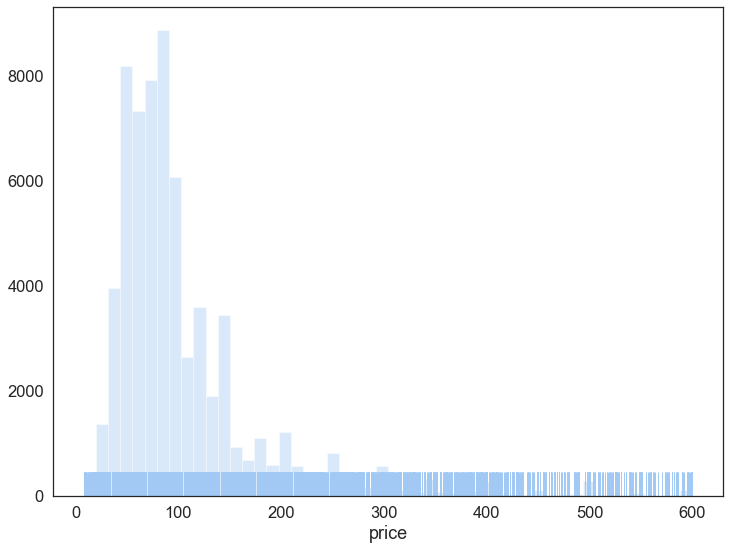

In [84]:
f, ax = plt.subplots(figsize=(12, 9))
sns.distplot(df['price'], kde=False, rug=True);

In [88]:
df.head()

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size_ready,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review,size0,size1,size2,size3,size_combined,size_combined1
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,40.241311,https://www.airbnb.com/rooms/3109,I bedroom appartment in Paris 14 Good restaura...,2008-10-14,within a few hours,100%,0-59%,0.0,0.0,Observatoire,48.83349,2.31852,Apartment,Entire home/apt,1.0,60.0,2,30,351,9,2016-12-27,2019-10-24,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2-3 years,2-6 months,NaN,NaN,NaN,NaN,NaN,NaN
5396,2,1.0,0.0,36.0,0.0,0.0,1,1.681423,28.834036,https://www.airbnb.com/rooms/5396,"Cozy, well-appointed and graciously designed s...",2009-02-14,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,48.85100,2.35869,Apartment,Entire home/apt,1.0,115.0,1,2,32,215,2009-06-30,2020-03-01,80-94/100,0-8/10,0-8/10,9/10,9/10,10/10,0-8/10,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,4+ years,2-8 weeks,NaN,NaN,NaN,NaN,NaN,NaN
7397,4,1.0,2.0,50.0,200.0,10.0,2,0.839236,40.000000,https://www.airbnb.com/rooms/7397,"VERY CONVENIENT, WITH THE BEST LOCATION ! PLEA...",2008-08-30,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,48.85758,2.35275,Apartment,Entire home/apt,2.0,119.0,4,23,238,268,2011-04-08,2020-02-26,80-94/100,10/10,9/10,10/10,10/10,10/10,10/10,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks,40,NaN,NaN,NaN,40,NaN
7964,2,1.0,1.0,60.0,500.0,20.0,2,1.155681,44.430605,https://www.airbnb.com/rooms/7964,Very large & nice apartment all for you! - Su...,2009-06-18,within a few hours,100%,0-59%,0.0,1.0,Opéra,48.87417,2.34245,Apartment,Entire home/apt,1.0,130.0,6,365,274,6,2010-05-10,2015-09-14,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4+ years,1+ year,NaN,NaN,NaN,NaN,NaN,NaN
9359,2,1.0,1.0,200.0,1500.0,30.0,1,0.648235,63.781779,https://www.airbnb.com/rooms/9359,Location! Location! Location! Just bring your ...,2009-07-29,within a day,100%,unknown,0.0,0.0,Louvre,48.85899,2.34735,Apartment,Entire home/apt,1.0,75.0,180,365,15,0,NaT,NaT,nan,nan,nan,nan,nan,nan,nan,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,nan,nan,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="price", color="price",
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [90]:
df_neighboorhood = df.groupby('neighbourhood_cleansed').agg(lambda x: x.tolist())

In [91]:
df_neighboorhood.loc[:, 'mean_price'] = df_neighboorhood.price.map(lambda x: np.mean(x))
df_neighboorhood.reset_index(inplace=True)
df_neighboorhood.head()

,neighbourhood_cleansed,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size_ready,listing_url,description,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,latitude,longitude,property_type,room_type,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review,size0,size1,size2,size3,size_combined,size_combined1,mean_price
0,Batignolles-Monceau,"[2, 4, 4, 3, 6, 10, 4, 3, 3, 1, 1, 4, 3, 2, 2,...","[1.0, 1.0, 1.0, 1.0, 2.0, 4.5, 1.0, 1.0, 1.0, ...","[2.0, 1.0, 1.0, 1.0, 3.0, 4.0, 1.0, 1.0, 1.0, ...","[30.0, 50.0, 35.0, 0.0, 0.0, 0.0, 40.0, 0.0, 4...","[300.0, 0.0, 510.0, 800.0, 300.0, 1500.0, 0.0,...","[25.0, 0.0, 0.0, 15.0, 0.0, 60.0, 10.0, 0.0, 5...","[1, 1, 5, 2, 1, 5, 2, 1, 2, 1, 1, 1, 2, 1, 1, ...","[4.091276851556377, 3.3892463484359423, 3.7928...","[68.1861734821826, 54.0, 48.69252350471248, 44...","[https://www.airbnb.com/rooms/26567, https://w...",[Non Smoking Room(s) availability: Temporary...,"[2010-04-23 00:00:00, 2010-06-27 00:00:00, 201...","[within a few hours, unknown, unknown, within ...","[100%, unknown, unknown, 100%, 100%, 100%, 60-...","[0-59%, unknown, unknown, 60-99%, 60-99%, 60-9...","[1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, ...","[1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, ...","[48.89713, 48.88743, 48.88787, 48.87676, 48.87...","[2.32254, 2.31811, 2.31093, 2.29362, 2.29428, ...","[Apartment, Apartment, Apartment, Apartment, A...","[Entire home/apt, Entire home/apt, Entire home...","[2.0, 2.0, 2.0, 2.0, 4.0, 6.0, 1.0, 1.0, 2.0, ...","[49.0, 115.0, 105.0, 80.0, 310.0, 600.0, 60.0,...","[7, 2, 5, 5, 6, 1, 3, 3, 4, 10, 5, 7, 4, 6, 6,...","[75, 15, 20, 27, 30, 365, 8, 30, 365, 365, 730...","[158, 0, 0, 46, 64, 352, 14, 0, 85, 276, 290, ...","[9, 1, 9, 164, 70, 540, 41, 54, 304, 41, 95, 1...","[2011-10-18 00:00:00, 2018-07-12 00:00:00, 201...","[2016-06-26 00:00:00, 2018-07-12 00:00:00, 201...","[0-79/100, 95-100/100, 80-94/100, 80-94/100, 9...","[9/10, 10/10, 10/10, 9/10, 10/10, 10/10, 9/10,...","[0-8/10, 10/10, 9/10, 9/10, 10/10, 10/10, 0-8/...","[9/10, 10/10, 10/10, 10/10, 10/10, 10/10, 9/10...","[0-8/10, 0-8/10, 10/10, 10/10, 10/10, 10/10, 9...","[0-8/10, 10/10, 9/10, 10/10, 10/10, 10/10, 0-8...","[0-8/10, 0-8/10, 9/10, 9/10, 10/10, 10/10, 9/1...","[0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, ...","[strict_14_with_grace_period, strict_14_with_g...","[3, 1, 1, 1, 1, 1, 1, 2, 2, 3, 3, 1, 1, 1, 1, ...","[3273.0, 3208.0, 3183.0, 3058.0, 3052.0, 2973....","[16, 17, 8, 23, 28, 44, 19, 20, 11, 25, 42, 15...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ...","[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, ...","[1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4+ years, 1-2 years, 4+ years, 4+ years, 4+ y...","[1+ year, 1+ year, 1+ year, 2-6 months, 2-6 mo

In [92]:
import json
with open('data/neighbourhoods_paris.geojson') as response:
    geo_data = json.load(response)

import plotly.express as px
fig = px.choropleth(df_neighboorhood, geojson=geo_data, locations='neighbourhood_cleansed',featureidkey="properties.neighbourhood", color='mean_price',
                           color_continuous_scale="Viridis",scope="europe", hover_data=["neighbourhood_cleansed"],
                           labels={'price':'mean_price'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Model Preparation / Linear Regression etc. 

In [308]:
df_model = df.drop(['listing_url', 'description', 'host_since', 'latitude', 'longitude','first_review','last_review'], axis=1)
df_model_dum = pd.get_dummies(df_model.copy(),drop_first=True)

In [309]:
def multi_collinearity_heatmap(df, figsize=(11,9)):
    
    """
    Creates a heatmap of correlations between features in the df. A figure size can optionally be set.
    """
    
    # Set the style of the visualization
    sns.set(style="white")

    # Create a covariance matrix
    corr = df.corr()

    # Generate a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());

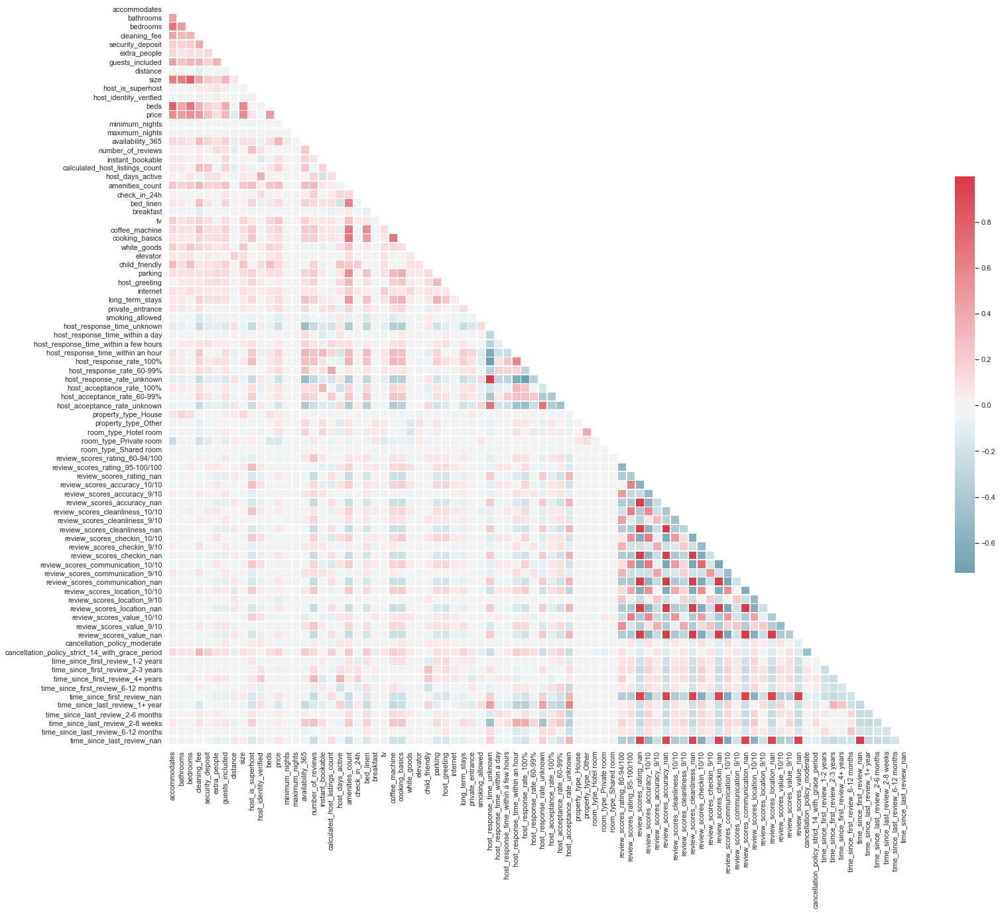

In [310]:
multi_collinearity_heatmap(df_model_dum.drop(list(df_model_dum.columns[df_model_dum.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [311]:
# Dropping collinear features
to_drop = ['beds',
           'bedrooms',
           'guests_included', 
           'host_acceptance_rate_unknown',
           'host_response_rate_unknown',
           'room_type_Private room']
to_drop.extend(list(df_model_dum.columns[df_model_dum.columns.str.endswith('nan')]))

df_model_dum.drop(to_drop, axis=1, inplace=True)

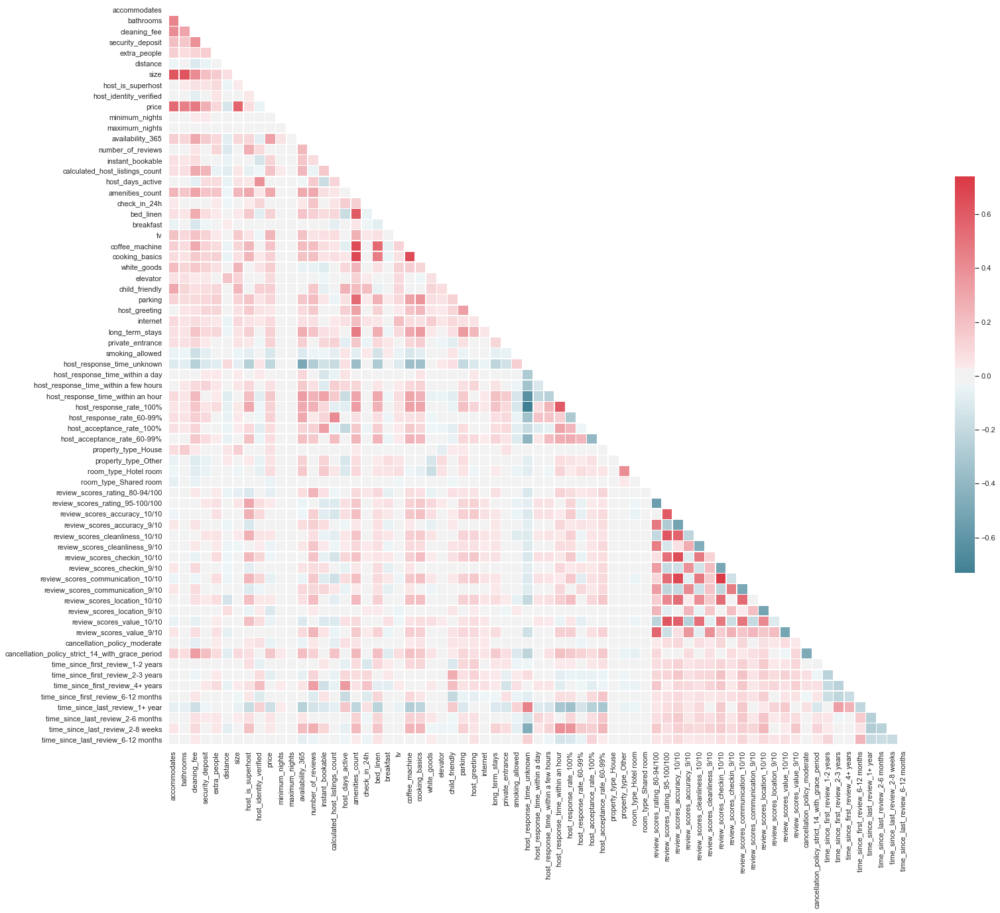

In [312]:
multi_collinearity_heatmap(df_model_dum.drop(list(df_model_dum.columns[df_model_dum.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [313]:
y = df_model_dum.pop("price")

In [314]:
y = np.log(y)

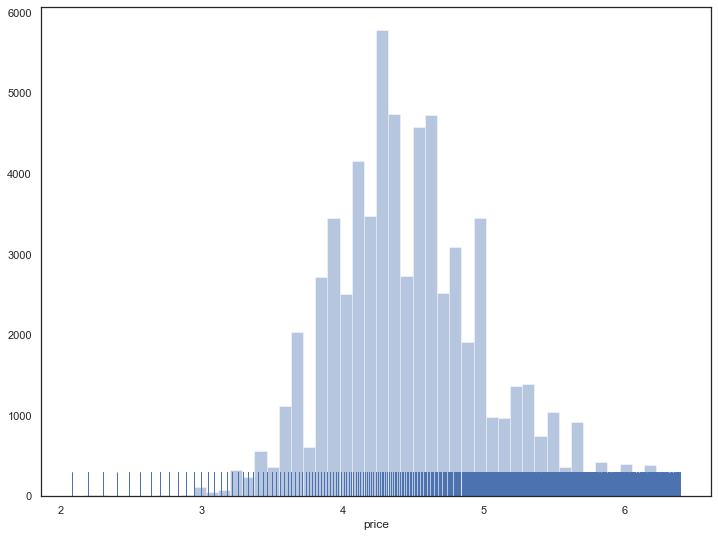

In [315]:
f, ax = plt.subplots(figsize=(12, 9))
sns.distplot(y, kde=False, rug=True);

In [316]:
X = df_model_dum

In [317]:
numeric_features = list(X.select_dtypes(include=[np.number]).columns.values)

In [318]:
df_model_dum.iloc[:,:-1].columns.nunique()

86

In [319]:
len(numeric_features)

87

In [320]:
object_features = list(X.select_dtypes(include=[np.object]).columns.values)

In [321]:
len(object_features)

0

In [322]:
# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))
# Splitting
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=10)
#X_train, X_test, y_train, y_test = train_test_split(X,y, stratify=df_model['cancellation_policy'], random_state=10)
#X_modeltrain, X_finalval, y_modeltrain, y_finalval = train_test_split(X,y,random_state=10)
#X_train, X_test, y_train, y_test = train_test_split(X_modeltrain,y_modeltrain,random_state=10)

In [323]:
#imputer1 = SimpleImputer(strategy="median")
#scaler1 = StandardScaler()
#numeric_transformer = make_pipeline(imputer1,scaler1)
#
#
#imputer2 = SimpleImputer(strategy='constant', fill_value='missing')
#encoder = OneHotEncoder(handle_unknown='error')
#object_transformer = make_pipeline(imputer2,encoder)
#
#preprocessor = ColumnTransformer(
#    transformers=[
#        ('num', numeric_transformer, numeric_features),
#        ('cat', object_transformer, object_features)
#    ])

In [324]:
#X_train_transformed = preprocessor.fit_transform(X_train)
#X_test_transformed = preprocessor.fit_transform(X_test)
# Hier kann man so das ganze wieder in einen DataFrame machen!! Für Pipeline!! 
#X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

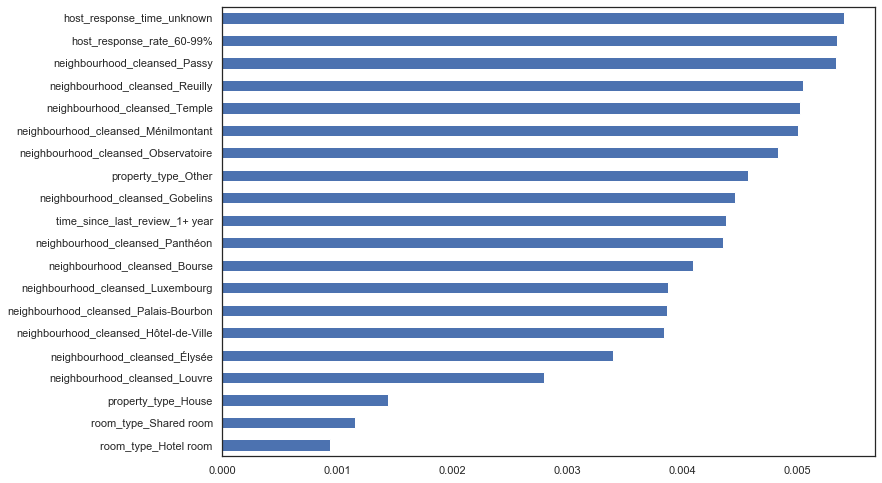

In [325]:
lab_enc = preprocessing.LabelEncoder()

feature_model = ExtraTreesClassifier(n_estimators=50)
feature_model.fit(X_train,lab_enc.fit_transform(y_train))

plt.figure()
feat_importances = pd.Series(feature_model.feature_importances_, index=X_train.columns)
feat_importances.nsmallest(20).plot(kind='barh')
plt.show()

In [326]:
#X_train.cancellation_policy.value_counts()

In [327]:
#X_test.cancellation_policy.nunique()

In [328]:
#X_train.room_type.unique()

In [329]:
#X_test.room_type.unique()

In [330]:
#X_train_transformed

In [331]:
#X_test_transformed

# Predictive modeling

In [219]:
### Linear Regression ###

def linear_reg(input_x, input_y, cv=5):
    ## Defining parameters
    model_LR= LinearRegression()

    parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}

    ## Building Grid Search algorithm with cross-validation and Mean Squared Error score.

    grid_search_LR = GridSearchCV(estimator=model_LR,  
                         param_grid=parameters,
                         scoring='neg_mean_squared_error',
                         cv=cv,
                         n_jobs=-1)

    ## Lastly, finding the best parameters.

    grid_search_LR.fit(input_x, input_y)
    best_parameters_LR = grid_search_LR.best_params_  
    best_score_LR = grid_search_LR.best_score_ 
    print(best_parameters_LR)
    print(best_score_LR)


# linear_reg(nyc_model_x, nyc_model_y)

In [211]:
### Ridge Regression ###

def ridge_reg(input_x, input_y, cv=5):
    ## Defining parameters
    model_Ridge= Ridge()

    # prepare a range of alpha values to test
    alphas = np.array([1,0.1,0.01,0.001,0.0001,0])
    normalizes= ([True,False])

    ## Building Grid Search algorithm with cross-validation and Mean Squared Error score.

    grid_search_Ridge = GridSearchCV(estimator=model_Ridge,  
                         param_grid=(dict(alpha=alphas, normalize= normalizes)),
                         scoring='neg_mean_squared_error',
                         cv=cv,
                         n_jobs=-1)

    ## Lastly, finding the best parameters.

    grid_search_Ridge.fit(input_x, input_y)
    best_parameters_Ridge = grid_search_Ridge.best_params_  
    best_score_Ridge = grid_search_Ridge.best_score_ 
    print(best_parameters_Ridge)
    print(best_score_Ridge)
    
# ridge_reg(nyc_model_x, nyc_model_y)

In [220]:
### Lasso Regression ###

def lasso_reg(input_x, input_y, cv=5):
    ## Defining parameters
    model_Lasso= Lasso()

    # prepare a range of alpha values to test
    alphas = np.array([1,0.1,0.01,0.001,0.0001,0])
    normalizes= ([True,False])

    ## Building Grid Search algorithm with cross-validation and Mean Squared Error score.

    grid_search_lasso = GridSearchCV(estimator=model_Lasso,  
                         param_grid=(dict(alpha=alphas, normalize= normalizes)),
                         scoring='neg_mean_squared_error',
                         cv=cv,
                         n_jobs=-1)

    ## Lastly, finding the best parameters.

    grid_search_lasso.fit(input_x, input_y)
    best_parameters_lasso = grid_search_lasso.best_params_  
    best_score_lasso = grid_search_lasso.best_score_ 
    print(best_parameters_lasso)
    print(best_score_lasso)

# lasso_reg(nyc_model_x, nyc_model_y)

In [221]:
### ElasticNet Regression ###

def elastic_reg(input_x, input_y,cv=5):
    ## Defining parameters
    model_grid_Elastic= ElasticNet()

    # prepare a range of alpha values to test
    alphas = np.array([1,0.1,0.01,0.001,0.0001,0])
    normalizes= ([True,False])

    ## Building Grid Search algorithm with cross-validation and Mean Squared Error score.

    grid_search_elastic = GridSearchCV(estimator=model_grid_Elastic,  
                         param_grid=(dict(alpha=alphas, normalize= normalizes)),
                         scoring='neg_mean_squared_error',
                         cv=cv,
                         n_jobs=-1)

    ## Lastly, finding the best parameters.

    grid_search_elastic.fit(input_x, input_y)
    best_parameters_elastic = grid_search_elastic.best_params_  
    best_score_elastic = grid_search_elastic.best_score_ 
    print(best_parameters_elastic)
    print(best_score_elastic)

# elastic_reg(nyc_model_x, nyc_model_y)

In [230]:
### Linear Regression ###
linear_reg(X, y, cv=4)

{'copy_X': True, 'fit_intercept': True, 'normalize': True}
-0.016254949352013128


In [231]:
### Ridge Regression ###
ridge_reg(X, y, cv=4)

{'alpha': 1.0, 'normalize': True}
-0.011823949349068566


In [232]:
### Lasso Regression ###
lasso_reg(X, y, cv=4)

{'alpha': 0.001, 'normalize': False}
-0.007094853736440466


In [233]:
## ElasticNet Regression ###
elastic_reg(X, y, cv=4)

{'alpha': 0.001, 'normalize': False}
-0.007072965754358413


In [238]:
#kfold_cv=KFold(n_splits=4, random_state=42, shuffle=False)
#for train_index, test_index in kfold_cv.split(X,y):
#    X_train_x, X_test_x = X[train_index], nyc_model_xx[test_index]
#    y_train_x, y_test_x = y[train_index], nyc_model_yx[test_index]

In [240]:
#Poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
#X_train = Poly.fit_transform(X_train)
#X_test = Poly.fit_transform(X_test)

In [332]:
###Linear Regression
lr = LinearRegression(copy_X= True, fit_intercept = True, normalize = True)
lr.fit(X_train, y_train)
lr_pred= lr.predict(X_test)

In [301]:
###Ridge
ridge = Ridge(alpha = 1.0, normalize = True)
ridge.fit(X_train, y_train)           
pred_ridge = ridge.predict(X_test) 

In [304]:
###Lasso
Lasso = Lasso(alpha = 0.001, normalize =False)
Lasso.fit(X_train, y_train)
pred_Lasso = Lasso.predict(X_test)

In [305]:
##ElasticNet
model_enet = ElasticNet(alpha = 0.001, normalize=False)
model_enet.fit(X_train, y_train) 
pred_train_enet= model_enet.predict(X_train)
pred_test_enet= model_enet.predict(X_test)

In [306]:
##XGBoost
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
pred_train_xgb = xgb_reg.predict(X_train)
pred_test_xgb = xgb_reg.predict(X_test)

[15:57:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [333]:
print('-------------Linear Regression-----------')

print('RMSE: %f'% np.sqrt(mean_squared_error(y_test, lr_pred)))   
print('R2 %f' % r2_score(y_test, lr_pred))

print('---------------Ridge ---------------------')

print('RMSE: %f'% np.sqrt(mean_squared_error(y_test, pred_ridge)))   
print('R2 %f' % r2_score(y_test, pred_ridge))

print('---------------Lasso-----------------------')

print('RMSE: %f' % np.sqrt(mean_squared_error(y_test, pred_Lasso)))
print('R2 %f' % r2_score(y_test, pred_Lasso))

print('---------------ElasticNet-------------------')

print('RMSE: %f' % np.sqrt(mean_squared_error(y_test,pred_test_enet))) #RMSE
print('R2 %f' % r2_score(y_test, pred_test_enet))

print('---------------XGBoost-------------------')

print('RMSE: %f' % np.sqrt(mean_squared_error(y_test,pred_test_xgb))) #RMSE
print('R2 %f' % r2_score(y_test, pred_test_xgb))

-------------Linear Regression-----------
RMSE: 0.364307
R2 0.608007
---------------Ridge ---------------------
RMSE: 0.389975
R2 0.550822
---------------Lasso-----------------------
RMSE: 0.364558
R2 0.607467
---------------ElasticNet-------------------
RMSE: 0.364405
R2 0.607795
---------------XGBoost-------------------
RMSE: 0.343294
R2 0.651921


In [131]:
lin_reg = LinearRegression()

In [132]:
lin_reg.fit(X_train_transformed, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [133]:
y_pred_train = lin_reg.predict(X_train_transformed)
y_pred_test = lin_reg.predict(X_test_transformed)

In [134]:
RMSE = np.sqrt(mean_squared_error(y_test, y_pred_test))
print(f"RMSE: {round(RMSE, 4)}")

RMSE: 65.9971


In [135]:
r2 = r2_score(y_test, y_pred_test)
r2
print(f"r2: {round(r2, 4)}")

r2: 0.3254


## XGBoost

In [136]:
xgb_reg = xgb.XGBRegressor()
#model_xgb = make_pipeline(preprocessor,xgb_reg)

In [137]:
xgb_reg.fit(X_train_transformed, y_train)

[15:07:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [138]:
y_pred_train = xgb_reg.predict(X_train_transformed)
y_pred_test = xgb_reg.predict(X_test_transformed)

In [139]:
RMSE = np.sqrt(mean_squared_error(y_test, y_pred_test))
print(f"RMSE: {round(RMSE, 4)}")

RMSE: 62.4266


In [140]:
r2 = r2_score(y_test, y_pred_test)
r2
print(f"r2: {round(r2, 4)}")

r2: 0.3964


In [141]:
##create Grid
#param_grid = {'n_estimators': [100, 150, 200],
#              'learning_rate': [0.01, 0.05, 0.1], 
#              'max_depth': [3, 4, 5, 6, 7],
#              'colsample_bytree': [0.6, 0.7, 1],
#              'gamma': [0.0, 0.1, 0.2]}
#
## instantiate the tuned random forest
#xgb_reg_grid_search = GridSearchCV(xgb_reg, param_grid, cv=3, n_jobs=-1)
#
## train the tuned random forest
#xgb_reg_grid_search.fit(X_train_transformed, y_train)
#
##print best estimator parameters found during the grid search
#print(xgb_reg_grid_search.best_params_)

In [142]:
# instantiate xgboost with best parameters
xgb_reg = xgb.XGBRegressor(colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, 
                           max_depth=6, n_estimators=200, random_state=4)

# train
xgb_reg.fit(X_train_transformed, y_train)

# predict
y_pred_train = xgb_reg.predict(X_train_transformed)
y_pred_test = xgb_reg.predict(X_test_transformed)

[15:07:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [143]:
RMSE = np.sqrt(mean_squared_error(y_test, y_pred_test))
print(f"RMSE: {round(RMSE, 4)}")

RMSE: 62.9186


In [144]:
r2 = r2_score(y_test, y_pred_test)
r2
print(f"r2: {round(r2, 4)}")

r2: 0.3869


# Model Preparation XGBoost / Neural Network

## correlation matrix

In [90]:
#col = ['neighbourhood_cleansed', 'property_type',
#       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
#       'bed_type', 'price', 'security_deposit', 'cleaning_fee',
#       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',
#       'number_of_reviews', 'instant_bookable',
#       'cancellation_policy', 'calculated_host_listings_count',
#       'amenities_count', 'time_since_first_review', 'time_since_last_review','size_ready','distance']

In [91]:
#col = ['neighbourhood_cleansed', 'property_type',
#       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
#       'bed_type', 'price', 'security_deposit', 'cleaning_fee',
#       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',
#       'number_of_reviews', 'instant_bookable',
#       'cancellation_policy', 'calculated_host_listings_count',
#       'amenities_count']

In [93]:
df_model = df.drop(['listing_url', 'description', 'host_since', 'latitude', 'longitude','first_review','last_review'], axis=1)
df_model.head()

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size_ready,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,property_type,room_type,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,40.241311,within a few hours,100%,0-59%,0.0,0.0,Observatoire,Apartment,Entire home/apt,1.0,60.0,2,30,351,9,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,flexible,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2-3 years,2-6 months
5396,2,1.0,0.0,36.0,0.0,0.0,1,1.681423,28.834036,within an hour,100%,100%,0.0,1.0,Hôtel-de-Ville,Apartment,Entire home/apt,1.0,115.0,1,2,32,215,80-94/100,0-8/10,0-8/10,9/10,9/10,10/10,0-8/10,1,strict_14_with_grace_period,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,4+ years,2-8 weeks
7397,4,1.0,2.0,50.0,200.0,10.0,2,0.839236,40.000000,within an hour,100%,60-99%,1.0,1.0,Hôtel-de-Ville,Apartment,Entire home/apt,2.0,119.0,4,23,238,268,80-94/100,10/10,9/10,10/10,10/10,10/10,10/10,0,moderate,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-8 weeks
7964,2,1.0,1.0,60.0,500.0,20.0,2,1.155681,44.430605,within a few hours,100%,0-59%,0.0,1.0,Opéra,Apartment,Entire home/apt,1.0,130.0,6,365,274,6,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,strict_14_with_grace_period,1,3582.0,12,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4+ years,1+ year
9359,2,1.0,1.0,200.0,1500.0,30.0,1,0.648235,63.781779,within a day,100%,unknown,0.0,0.0,Louvre,Apartment,Entire home/apt,1.0,75.0,180,365,15,0,nan,nan,nan,nan,nan,nan,nan,0,strict_14_with_grace_period,1,3541.0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,nan,nan


In [94]:
def multi_collinearity_heatmap(df, figsize=(11,9)):
    
    """
    Creates a heatmap of correlations between features in the df. A figure size can optionally be set.
    """
    
    # Set the style of the visualization
    sns.set(style="white")

    # Create a covariance matrix
    corr = df.corr()

    # Generate a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());

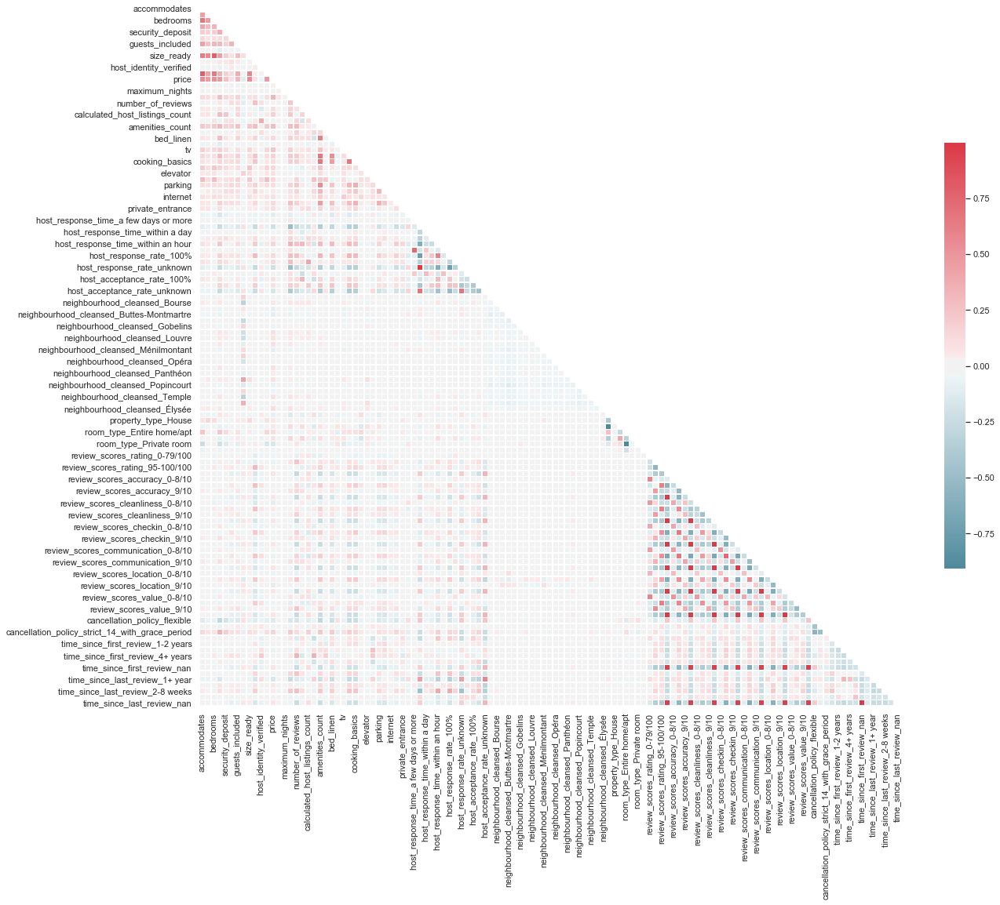

In [95]:
df_model_dum = pd.get_dummies(df_model.copy())
multi_collinearity_heatmap(df_model_dum, figsize=(20,20))

In [96]:
df_model_dum.head()

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size_ready,host_is_superhost,host_identity_verified,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,instant_bookable,calculated_host_listings_count,host_days_active,amenities_count,check_in_24h,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,private_entrance,smoking_allowed,host_response_time_a few days or more,host_response_time_unknown,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,host_response_rate_0-59%,host_response_rate_100%,host_response_rate_60-99%,host_response_rate_unknown,host_acceptance_rate_0-59%,host_acceptance_rate_100%,host_acceptance_rate_60-99%,host_acceptance_rate_unknown,neighbourhood_cleansed_Batignolles-Monceau,neighbourhood_cleansed_Bourse,neighbourhood_cleansed_Buttes-Chaumont,neighbourhood_cleansed_Buttes-Montmartre,neighbourhood_cleansed_Entrepôt,neighbourhood_cleansed_Gobelins,neighbourhood_cleansed_Hôtel-de-Ville,neighbourhood_cleansed_Louvre,neighbourhood_cleansed_Luxembourg,neighbourhood_cleansed_Ménilmontant,neighbourhood_cleansed_Observatoire,neighbourhood_cleansed_Opéra,neighbourhood_cleansed_Palais-Bourbon,neighbourhood_cleansed_Panthéon,neighbourhood_cleansed_Passy,neighbourhood_cleansed_Popincourt,neighbourhood_cleansed_Reuilly,neighbourhood_cleansed_Temple,neighbourhood_cleansed_Vaugirard,neighbourhood_cleansed_Élysée,property_type_Apartment,property_type_House,property_type_Other,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,review_scores_rating_0-79/100,review_scores_rating_80-94/100,review_scores_rating_95-100/100,review_scores_rating_nan,review_scores_accuracy_0-8/10,review_scores_accuracy_10/10,review_scores_accuracy_9/10,review_scores_accuracy_nan,review_scores_cleanliness_0-8/10,review_scores_cleanliness_10/10,review_scores_cleanliness_9/10,review_scores_cleanliness_nan,review_scores_checkin_0-8/10,review_scores_checkin_10/10,review_scores_checkin_9/10,review_scores_checkin_nan,review_scores_communication_0-8/10,review_scores_communication_10/10,review_scores_communication_9/10,review_scores_communication_nan,review_scores_location_0-8/10,review_scores_location_10/10,review_scores_location_9/10,review_scores_location_nan,review_scores_value_0-8/10,review_scores_value_10/10,review_scores_value_9/10,review_scores_value_nan,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict_14_with_grace_period,time_since_first_review_0-6 months,time_since_first_review_1-2 years,time_since_first_review_2-3 years,time_since_first_review_4+ years,time_since_first_review_6-12 months,time_since_first_review_nan,time_since_last_review_0-2 weeks,time_since_last_review_1+ year,time_since_last_review_2-6 months,time_since_last_review_2-8 weeks,time_since_last_review_6-12 months,time_since_last_review_nan
3109,2,1.0,0.0,60.0,150.0,0.0,1,4.127306,40.241311,0.0,0.0,1.0,60.0,2,30,351,9,0,1,3829.0,16,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0
5396,2,1.0,0.0,36.0,0.0,0.0,1,1.681423,28.834036,0.0,1.0,1.0,115.0,1,2,32,215,1,1,3706.0,17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0
7397,4,1.0,2.0,50.0,200.0,10.0,2,0.839236,40.000000,1.0,1.0,2.0,119.0,4,23,238,268,0,1,3874.0,30,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0
7964,2,1.0,1.0,60

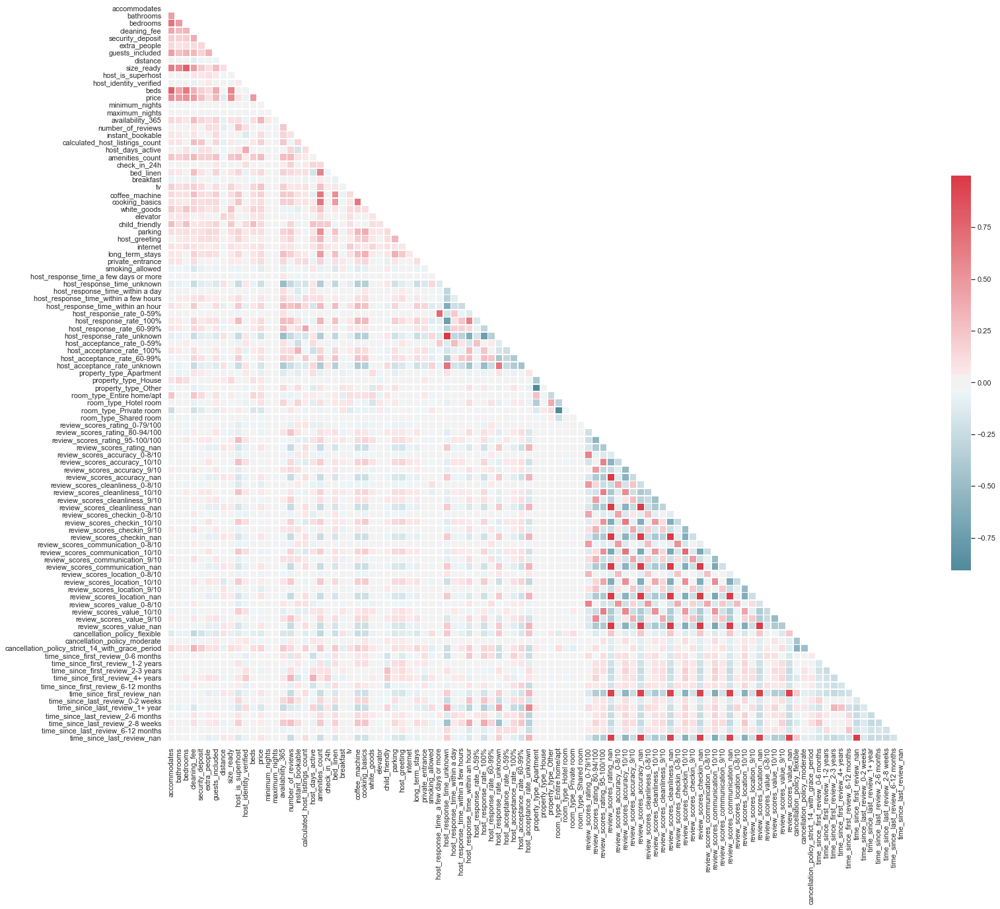

In [97]:
multi_collinearity_heatmap(df_model_dum.drop(list(df_model_dum.columns[df_model_dum.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [98]:
# Dropping collinear features
to_drop = ['beds',
           'bedrooms',
           'guests_included', 
           'host_acceptance_rate_unknown',
           'host_response_rate_unknown',
           'host_response_rate_0-59%',
           'property_type_Apartment',
           'room_type_Private room']
to_drop.extend(list(df_model_dum.columns[df_model_dum.columns.str.endswith('nan')]))

df_model_dum.drop(to_drop, axis=1, inplace=True)

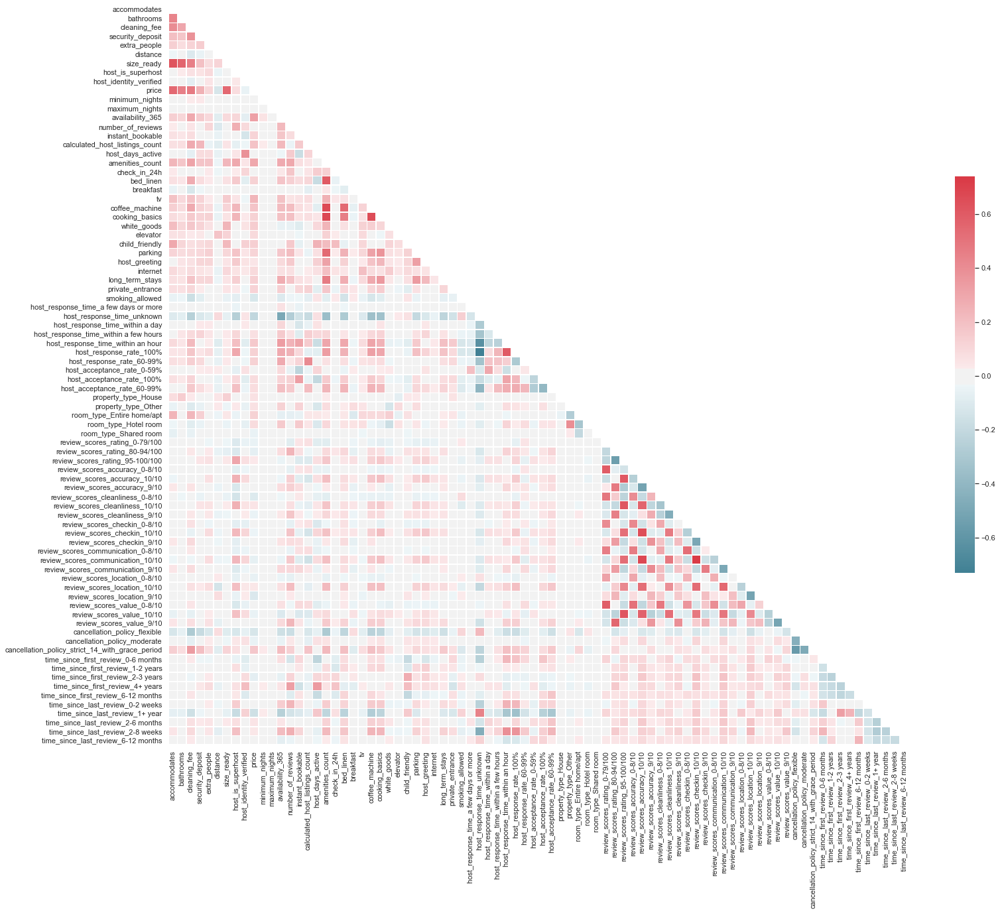

In [99]:
multi_collinearity_heatmap(df_model_dum.drop(list(df_model_dum.columns[df_model_dum.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [100]:
df_model_dum.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65535 entries, 3109 to 42913034
Columns: 102 entries, accommodates to time_since_last_review_6-12 months
dtypes: float64(25), int64(8), uint8(69)
memory usage: 21.3 MB


In [101]:
numeric_features = list(df_model_dum.select_dtypes(include=[np.number]).columns.values)

In [102]:
num_columns = ['accommodates','bathrooms',
               'cleaning_fee','security_deposit',
               'extra_people','distance','size_ready',
               'price','minimum_nights','maximum_nights',
               'availability_365','number_of_reviews',
               'calculated_host_listings_count',
               'amenities_count','host_days_active']

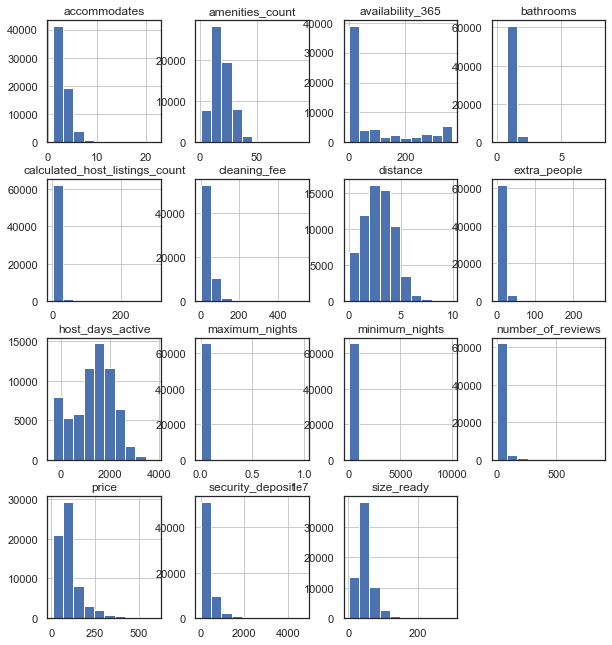

In [103]:
df_model_dum[num_columns].hist(figsize=(10,11));

In [104]:
# Log transforming columns
num_columns = [i for i in num_columns if i not in ['availability_60', 'host_days_active']] # Removing items not to be transformed

for col in num_columns:
    df_model_dum[col] = df_model_dum[col].astype('float64').replace(0.0, 0.01) # Replacing 0s with 0.01
    df_model_dum[col] = np.log(df_model_dum[col])

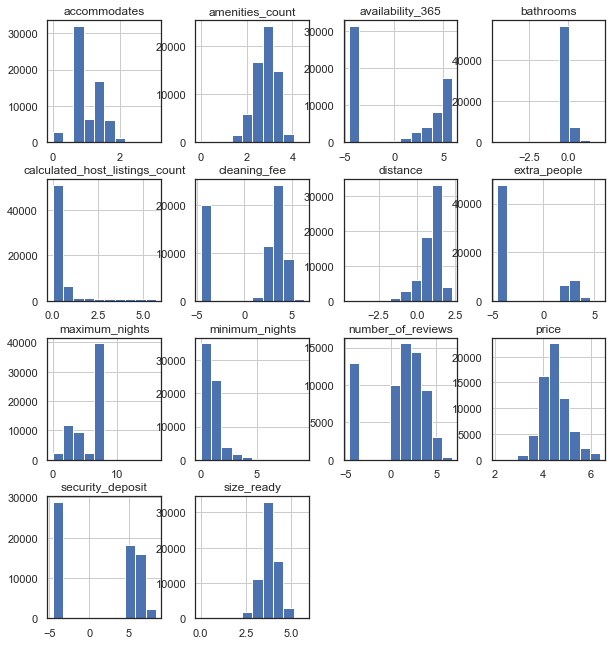

In [105]:
 df_model_dum[num_columns].hist(figsize=(10,11));

In [106]:
# Separating X and y
X = df_model_dum.drop('price', axis=1)
y = df_model_dum.price

# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

## train test split

In [107]:
# Splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

## XGBoost

In [108]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)

print("\nTraining MSE:", round(mean_squared_error(y_train, training_preds_xgb_reg),4))
print("Validation MSE:", round(mean_squared_error(y_test, val_preds_xgb_reg),4))
print("\nTraining r2:", round(r2_score(y_train, training_preds_xgb_reg),4))
print("Validation r2:", round(r2_score(y_test, val_preds_xgb_reg),4))

[16:34:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training MSE: 0.1128
Validation MSE: 0.1128

Training r2: 0.6663
Validation r2: 0.6739


In [109]:
df_model.instant_bookable = df_model.instant_bookable.astype(object)

In [81]:
ft_weights_xgb_reg = pd.DataFrame(xgb_reg.feature_importances_, columns=['weight'], index=X_train.columns)
ft_weights_xgb_reg.sort_values('weight', inplace=True)
ft_weights_xgb_reg

NameError: name 'xgb_reg' is not defined

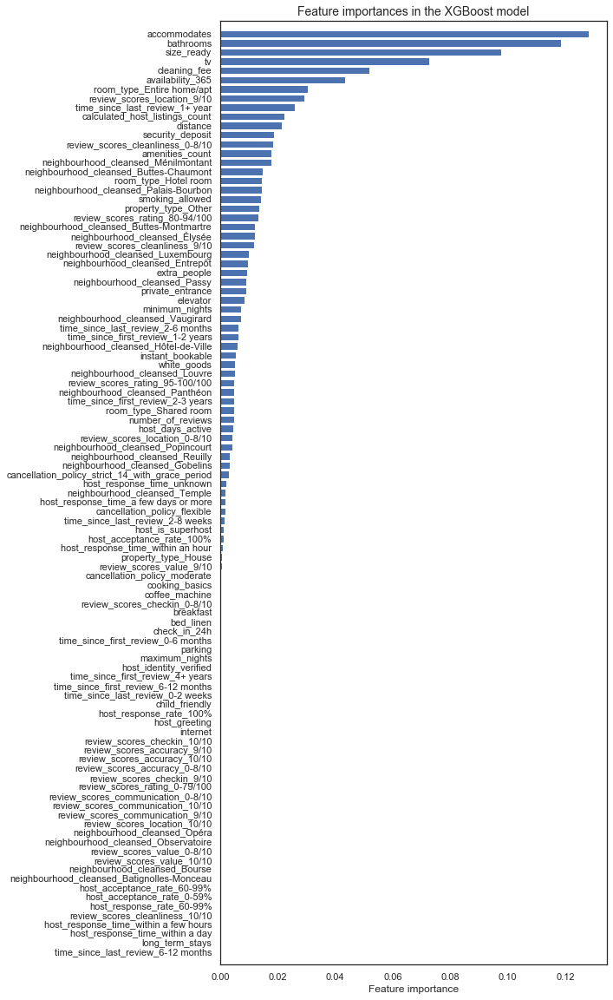

In [111]:
# Plotting feature importances
plt.figure(figsize=(8,20))
plt.barh(ft_weights_xgb_reg.index, ft_weights_xgb_reg.weight, align='center') 
plt.title("Feature importances in the XGBoost model", fontsize=14)
plt.xlabel("Feature importance")
plt.margins(y=0.01)
plt.show()

### Hyperparameter-Tuning

In [122]:
#create Grid
param_grid = {'n_estimators': [100, 150, 200],
              'learning_rate': [0.01, 0.05, 0.1], 
              'max_depth': [3, 4, 5, 6, 7],
              'colsample_bytree': [0.6, 0.7, 1],
              'gamma': [0.0, 0.1, 0.2]}

# instantiate the tuned random forest
xgb_reg_grid_search = GridSearchCV(xgb_reg, param_grid, cv=3, n_jobs=-1)
#
# train the tuned random forest
xgb_reg_grid_search.fit(X_train, y_train)

#print best estimator parameters found during the grid search
print(xgb_reg_grid_search.best_params_)

[23:00:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
{'colsample_bytree': 0.7, 'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}


### Tuned XGB Model

In [123]:
xgb_reg = xgb.XGBRegressor(colsample_bytree=0.7, gamma=0.0, learning_rate=0.1, 
                           max_depth=7, n_estimators=200, random_state=4)
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)

print("\nTraining MSE:", round(mean_squared_error(y_train, training_preds_xgb_reg),4))
print("Validation MSE:", round(mean_squared_error(y_test, val_preds_xgb_reg),4))
print("\nTraining r2:", round(r2_score(y_train, training_preds_xgb_reg),4))
print("Validation r2:", round(r2_score(y_test, val_preds_xgb_reg),4))

[08:57:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training MSE: 0.062
Validation MSE: 0.0894

Training r2: 0.8168
Validation r2: 0.7417


## Neural Network

In [112]:
# Building the model
nn1 = models.Sequential()
nn1.add(layers.Dense(128, input_shape=(X_train.shape[1],), activation='relu'))
nn1.add(layers.Dense(256, activation='relu'))
nn1.add(layers.Dense(256, activation='relu'))
nn1.add(layers.Dense(1, activation='linear'))

# Compiling the model
nn1.compile(loss='mean_squared_error',
            optimizer='adam',
            metrics=['mean_squared_error'])

# Model summary
print(nn1.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 128)               13056     
_________________________________________________________________
dense_2 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_3 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 257       
Total params: 112,129
Trainable params: 112,129
Non-trainable params: 0
_________________________________________________________________
None


In [114]:
early_stopping = keras.callbacks.EarlyStopping(patience=2)

nn1_history = nn1.fit(X_train,
                  y_train,
                  epochs=100,
                  batch_size=256,
                  callbacks=[early_stopping],
                  validation_data=(X_test, y_test))

Train on 52428 samples, validate on 13107 samples
Epoch 1/100
52428/52428 [==============================] - 4s 84us/step - loss: 0.5620 - mean_squared_error: 0.5620 - val_loss: 0.1684 - val_mean_squared_error: 0.1684
Epoch 2/100
52428/52428 [==============================] - 3s 64us/step - loss: 0.1517 - mean_squared_error: 0.1517 - val_loss: 0.1495 - val_mean_squared_error: 0.1495
Epoch 3/100
52428/52428 [==============================] - 4s 67us/step - loss: 0.1321 - mean_squared_error: 0.1321 - val_loss: 0.1342 - val_mean_squared_error: 0.1342
Epoch 4/100
52428/52428 [==============================] - 3s 66us/step - loss: 0.1215 - mean_squared_error: 0.1215 - val_loss: 0.1311 - val_mean_squared_error: 0.1311
Epoch 5/100
52428/52428 [==============================] - 4s 72us/step - loss: 0.1149 - mean_squared_error: 0.1149 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 6/100
52428/52428 [==============================] - 3s 66us/step - loss: 0.1107 - mean_squared_error: 0

In [116]:
y_test_pred = nn1.predict(X_test)
y_train_pred = nn1.predict(X_train)
print("Training MSE:", round(mean_squared_error(y_train, y_train_pred),4))
print("Validation MSE:", round(mean_squared_error(y_test, y_test_pred),4))
print("\nTraining r2:", round(r2_score(y_train, y_train_pred),4))
print("Validation r2:", round(r2_score(y_test, y_test_pred),4))

Training MSE: 0.0947
Validation MSE: 0.1343

Training r2: 0.7199
Validation r2: 0.6119


In [124]:
# Building the model
nn2 = models.Sequential()
nn2.add(layers.Dense(512,input_shape=(X_train.shape[1],), activation= 'relu'))
nn2.add(layers.Dropout(0.2))
nn2.add(layers.Dense(256, activation= 'relu'))
nn2.add(layers.Dropout(0.2))
nn2.add(layers.Dense(128, activation= 'relu'))
nn2.add(layers.Dense(1, activation= 'relu'))

# Compiling the model
nn2.compile(loss='mean_squared_error',
            optimizer='adam',
            metrics=['mean_squared_error'])

# Model summary
print(nn2.summary())

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 512)               52224     
_________________________________________________________________
dropout_5 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_15 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 129       
Total params: 216,577
Trainable params: 216,577
Non-trainable params: 0
________________________________________________

In [125]:
from keras.callbacks.callbacks import ModelCheckpoint
#set parameters
batch_size = 32
epochs = 40

filepath="weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]

hist = nn2.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(X_test, y_test),callbacks=callbacks_list)

Train on 52428 samples, validate on 13107 samples
Epoch 1/40
52428/52428 [==============================] - 138s 3ms/step - loss: 0.2881 - mean_squared_error: 0.2881 - val_loss: 0.3135 - val_mean_squared_error: 0.3135

Epoch 00001: val_loss improved from inf to 0.31348, saving model to weights-improvement-01-0.31.hdf5
Epoch 2/40
52428/52428 [==============================] - 153s 3ms/step - loss: 0.1825 - mean_squared_error: 0.1825 - val_loss: 0.5305 - val_mean_squared_error: 0.5305

Epoch 00002: val_loss did not improve from 0.31348
Epoch 3/40
52428/52428 [==============================] - 108s 2ms/step - loss: 0.1486 - mean_squared_error: 0.1486 - val_loss: 0.4226 - val_mean_squared_error: 0.4226

Epoch 00003: val_loss did not improve from 0.31348
Epoch 4/40
52428/52428 [==============================] - 115s 2ms/step - loss: 0.1302 - mean_squared_error: 0.1302 - val_loss: 0.2489 - val_mean_squared_error: 0.2489

Epoch 00004: val_loss improved from 0.31348 to 0.24893, saving model to

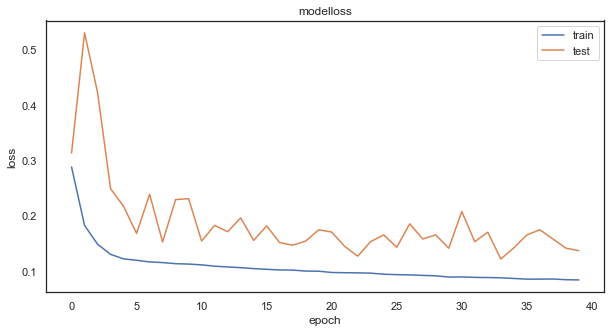

In [131]:
#plot training history
figsize=(10,5)
ax,_ = plt.subplots(figsize=figsize)
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('modelloss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'],loc='upperleft')
plt.show()

In [126]:
ls

Capstone/                         weights-improvement-05-0.21.hdf5
airbnb-Berlin.ipynb               weights-improvement-05-0.22.hdf5
airbnb-London.ipynb               weights-improvement-06-0.17.hdf5
airbnb-Munich.ipynb               weights-improvement-06-0.23.hdf5
airbnb-Paris.ipynb                weights-improvement-07-0.13.hdf5
airbnb-Paris1.ipynb               weights-improvement-07-0.18.hdf5
data/                             weights-improvement-08-0.13.hdf5
weights-improvement-01-0.29.hdf5  weights-improvement-08-0.15.hdf5
weights-improvement-01-0.31.hdf5  weights-improvement-11-0.18.hdf5
weights-improvement-01-0.37.hdf5  weights-improvement-14-0.14.hdf5
weights-improvement-01-0.41.hdf5  weights-improvement-17-0.15.hdf5
weights-improvement-02-0.33.hdf5  weights-improvement-18-0.15.hdf5
weights-improvement-02-0.34.hdf5  weights-improvement-22-0.14.hdf5
weights-improvement-03-0.24.hdf5  weights-improvement-23-0.13.hdf5
weights-improvement-04-0.21.hdf5  weights-improvement-24-0.13.

In [127]:
import os
import copy

saved_loss_file = None
loss_min = 100000
# r=root, d=directories, f = files
for r, d, f in os.walk('./'):
    for file in f:
        if '.hdf5' in file:
            filename = os.path.join(r, file)
            loss = int(filename.split('-')[3].split('.')[0])
            if loss < loss_min:
                loss_min = loss
                saved_loss_file = filename
                
print("Saved min loss : ",loss_min,"\nFile :",saved_loss_file)

Saved min loss :  0 
File : ./weights-improvement-04-0.21.hdf5


In [128]:
#load model
from keras.models import load_model
best_model = load_model(saved_loss_file)

In [129]:
#prediction
pred_mlp = best_model.predict(X_test)

In [130]:
#evaluate
print('\n# Model Evaluate')
results = best_model.evaluate(X_test, y_test)
print('Test Mse Loss:', results[0])

MSE = results[0]
print("MSE:",MSE)


# Model Evaluate
13107/13107 [==============================] - 2s 115us/step
Test Mse Loss: 0.20847324357135913
MSE: 0.20847324357135913


In [147]:
df_model.head()

,accommodates,bathrooms,bedrooms,cleaning_fee,security_deposit,extra_people,guests_included,distance,size_ready,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,property_type,room_type,beds,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,calculated_host_listings_count,host_days_active,amenities_count,balcony,bed_linen,tv,coffee_machine,cooking_basics,white_goods,elevator,child_friendly,parking,host_greeting,internet,long_term_stays,pets_allowed,private_entrance,smoking_allowed,time_since_first_review,time_since_last_review
36720,2,1.0,1.0,30.0,100.0,30.0,1,0.890657,57.000000,unknown,unknown,unknown,0.0,0.0,Ludwigsvorstadt-Isarvorstadt,Apartment,Entire home/apt,1.0,2,730,0,25,95-100/100,10/10,10/10,10/10,10/10,10/10,9/10,0,strict_14_with_grace_period,1,3200.0,11,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4+ years,1+ year
49309,2,1.0,2.0,0.0,0.0,0.0,1,2.052100,60.168187,unknown,unknown,unknown,0.0,0.0,Ludwigsvorstadt-Isarvorstadt,Apartment,Private room,2.0,14,180,295,40,95-100/100,10/10,10/10,10/10,10/10,10/10,9/10,0,moderate,1,3138.0,13,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,4+ years,1+ year
97945,2,1.0,1.0,10.0,0.0,10.0,1,6.978183,43.601842,within a few hours,100%,60-99%,1.0,0.0,Hadern,Apartment,Entire home/apt,1.0,2,90,187,131,95-100/100,10/10,10/10,10/10,10/10,9/10,9/10,0,flexible,2,2913.0,36,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,4+ years,2-6 months
114695,5,1.0,1.0,60.0,500.0,40.0,1,5.011225,50.000000,within an hour,100%,60-99%,1.0,1.0,Berg am Laim,Apartment,Entire home/apt,3.0,1,30,142,53,80-94/100,9/10,10/10,10/10,10/10,9/10,9/10,0,strict_14_with_grace_period,2,2889.0,37,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4+ years,2-6 months
127383,4,1.0,1.0,28.0,0.0,0.0,1,1.800059,55.000000,within a few hours,100%,60-99%,1.0,1.0,Maxvorstadt,Apartment,Entire home/apt,1.0,2,14,0,84,95-100/100,10/10,10/10,10/10,10/10,10/10,10/10,0,flexible,2,2875.0,38,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,4+ years,2-8 weeks
